# Clasificador de Lesiones Cutáneas - Notebook Procesamiento de Úlceras

In [1]:
# Importamos las librerías necesarias
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage.morphology as morph

In [2]:
def show_img_channel_and_histogram(img_channel, channel_name = 'Channel'):
    fig, axes = plt.subplots(1,2, figsize=(10,5))
    axes[0].imshow(img_channel, cmap='gray')
    axes[0].set_title(channel_name)
    axes[1].hist(img_channel.ravel(), bins=(np.max(img_channel) - np.min(img_channel)), density=True)
    axes[1].set_title('Histogram');

def show_img_mask_and_segmentation(img, mask, segmentation):
    fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize = (15,10))
    ax1.imshow(img)
    ax1.set_title('Original')
    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')
    ax3.imshow(segmentation)
    ax3.set_title('Segmentation');

A continuación vamos a segmentar cada una de las imágenes para construir nuestro dataset de úlceras para el proyecto. Cabe destacar que el código repetitivo de gráficar cada canal de color en diversos espacios de color para analizar rutas de segmentación se omite, ya que se desarrolló un script que mantiene una interfaz gráfica para hacer esta tarea y ahorrar enormes cantidades de código

## #1. U1

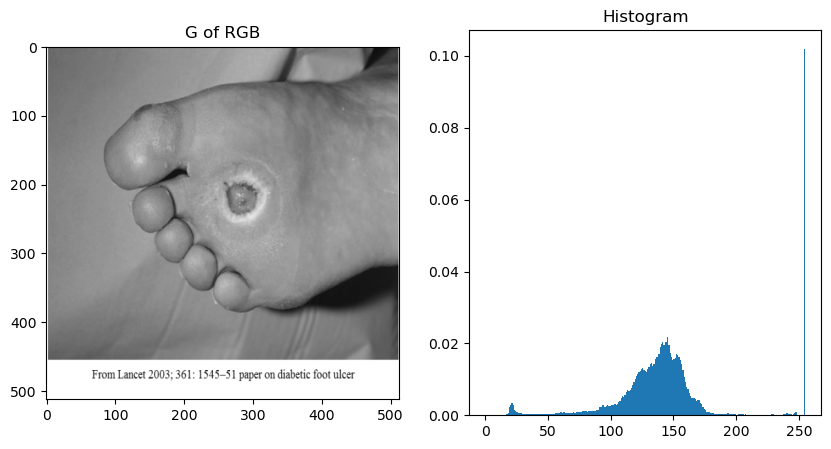

In [3]:
# Leemos la imagen
u1 = cv2.imread('Ulcers/U1.png')
u1_rgb = cv2.cvtColor(u1, cv2.COLOR_BGR2RGB)

# Tras analizar en los diversos espacios de color, se ha decidido trabajar en el espacio de color G del RGB y M de CMY
u1_g = u1[:,:,1].copy()

# Gráficamos ahora su histograma
show_img_channel_and_histogram(u1_g, 'G of RGB')

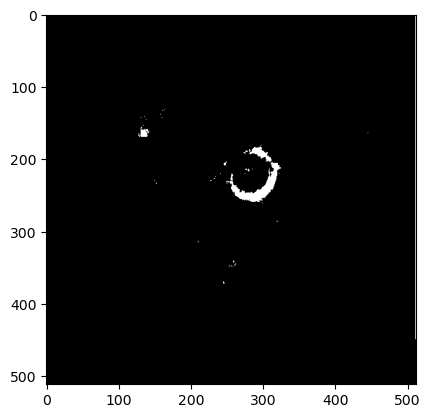

In [4]:
# Aplicamos un umbral para tomar la parte blancuzca que rodea la lesion
_, u1_g_thr = cv2.threshold(u1_g, 185, 255, cv2.THRESH_BINARY)
u1_g_thr[450:,:] = 0
u1_g_thr[:,:20] = 0
plt.imshow(u1_g_thr, cmap='gray');

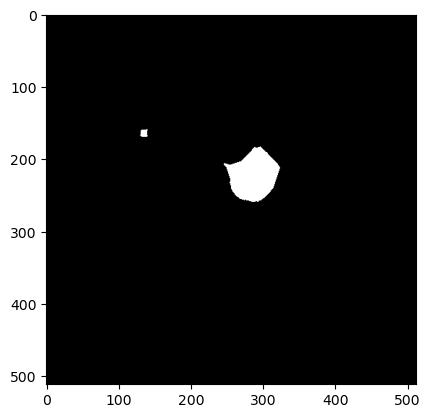

In [5]:
# Ahora usamos la operación de cierre para eliminar el ruido
se = morph.disk(7)
u1_g_thr_op = cv2.morphologyEx(u1_g_thr, cv2.MORPH_OPEN, morph.disk(1), iterations=1)
u1_g_thr_cl = cv2.morphologyEx(u1_g_thr_op, cv2.MORPH_CLOSE, se, iterations=5)
plt.imshow(u1_g_thr_cl, cmap='gray');

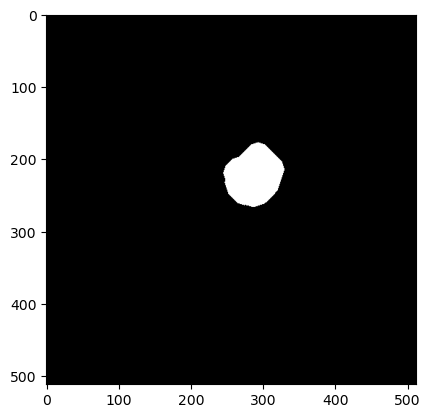

In [6]:
# Hacemos erosion para limpiar
u1_g_thr_cl_er = cv2.erode(u1_g_thr_cl, se, iterations=2)
# Y ahora una dilatación para mejorar la mascara
u1_mask = cv2.dilate(u1_g_thr_cl_er, se, iterations=3) > 127
plt.imshow(u1_mask, cmap='gray');

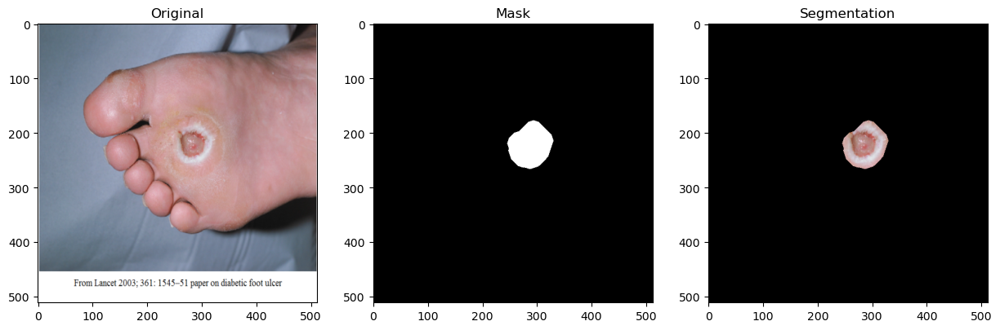

In [7]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u1_segmented = u1_rgb * u1_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u1_rgb, u1_mask, u1_segmented)

## #2. U2

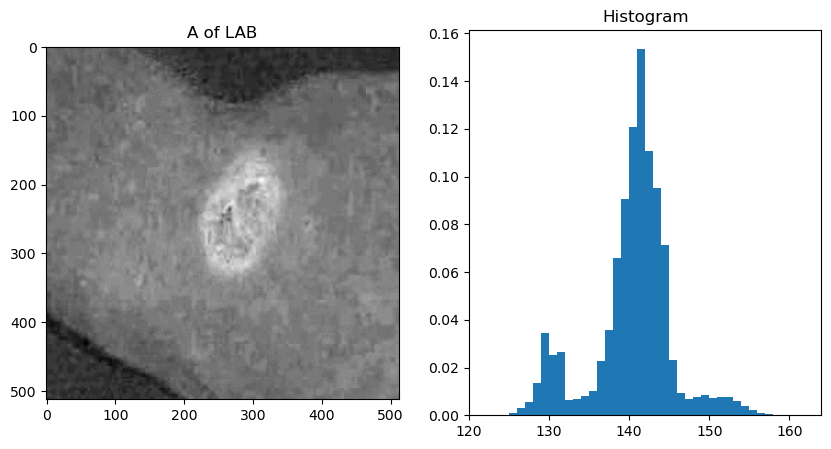

In [8]:
# Leemos la imagen
u2 = cv2.imread('Ulcers/U2.jpg')
u2_rgb = cv2.cvtColor(u2, cv2.COLOR_BGR2RGB)

# Tras analizar en los diversos espacios de color, se ha decidido trabajar en el espacio de color A del LAB
u2_a = cv2.cvtColor(u2, cv2.COLOR_BGR2LAB)[:,:,1]

# Gráficamos ahora su histograma
show_img_channel_and_histogram(u2_a, 'A of LAB')

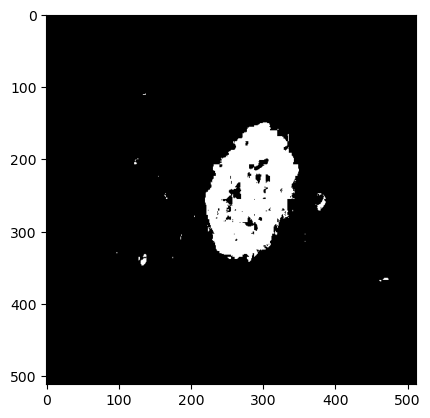

In [9]:
# Aplicamos un umbral más o menos mayor a 146, ya que la zona de la lesión es de una intensidad mayor
_, u2_a_thr = cv2.threshold(u2_a, 146, 255, cv2.THRESH_BINARY)
plt.imshow(u2_a_thr, cmap='gray');

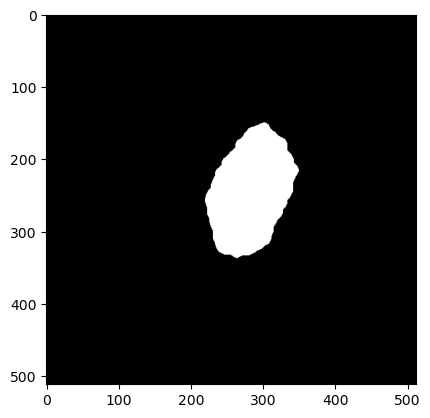

In [10]:
# Ahora aplicamos operaciones morfológicas, comenzando por una de apertura para limpiar la imagen
se2 = morph.disk(3)
u2_a_thr_op = cv2.morphologyEx(u2_a_thr, cv2.MORPH_OPEN, se2, iterations=2)

# Vamos ahora con una de cierre para mejorar la máscara de segmentación
se2 = morph.ellipse(5, 5)
u2_mask = cv2.morphologyEx(u2_a_thr_op, cv2.MORPH_CLOSE, se2, iterations=2) > 127
plt.imshow(u2_mask, cmap='gray');

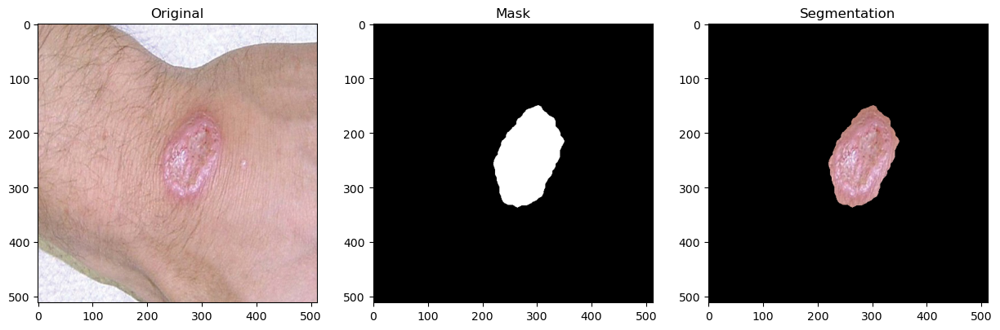

In [11]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u2_segmented = u2_rgb * u2_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u2_rgb, u2_mask, u2_segmented)

## #3. U3

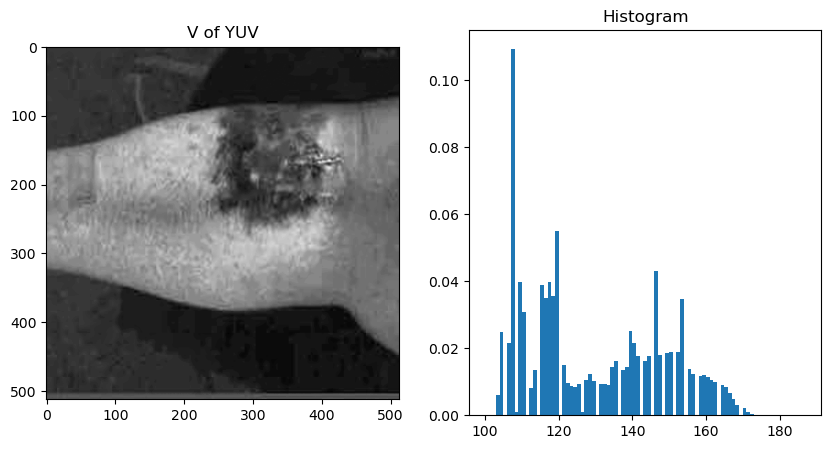

In [12]:
# Leemos la imagen
u3 = cv2.imread('Ulcers/U3.jpg')
u3_rgb = cv2.cvtColor(u3, cv2.COLOR_BGR2RGB)

# Tras analizar en los diversos espacios de color, se ha decidido trabajar en el espacio de color V del YUV
u3_v = cv2.cvtColor(u3, cv2.COLOR_BGR2YUV)[:,:,2]

# Gráficamos ahora su histograma
show_img_channel_and_histogram(u3_v, 'V of YUV')

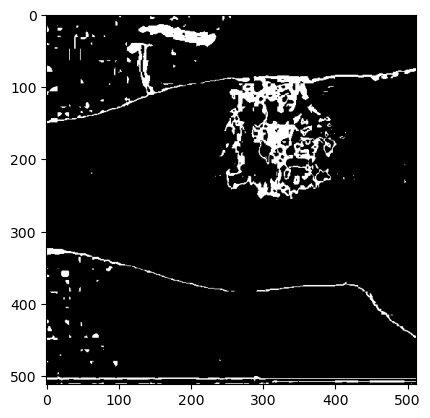

In [13]:
# Aplicamos un umbral bilateral estimando valores a partir del histograma para tomar la parte negra de la lesión
_, u3_v_thr1 = cv2.threshold(u3_v, 120, 255, cv2.THRESH_BINARY)
_, u3_v_thr2 = cv2.threshold(u3_v, 127, 255, cv2.THRESH_BINARY_INV)
u3_v_thr = cv2.bitwise_and(u3_v_thr1, u3_v_thr2)
plt.imshow(u3_v_thr, cmap='gray');

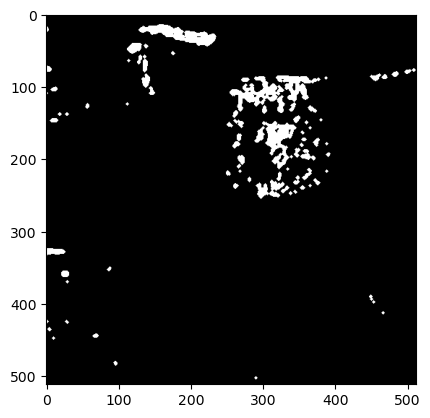

In [14]:
# Vamos ahora a aplicar operaciones morfológicas para mejorar la máscara, comenzando por una de apertura
se3 = morph.disk(2)
u3_v_thr_op = cv2.morphologyEx(u3_v_thr, cv2.MORPH_OPEN, se3, iterations=1)
plt.imshow(u3_v_thr_op, cmap='gray');

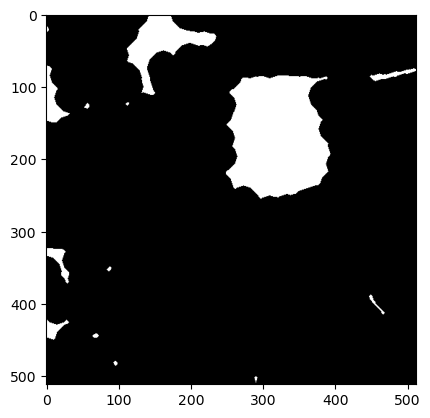

In [15]:
# Ahora aplicamos cierre para unir los pixeles de la lesión
se3 = morph.disk(7)
u3_v_thr_cl = cv2.morphologyEx(u3_v_thr_op, cv2.MORPH_CLOSE, se3, iterations=3)
plt.imshow(u3_v_thr_cl, cmap='gray');

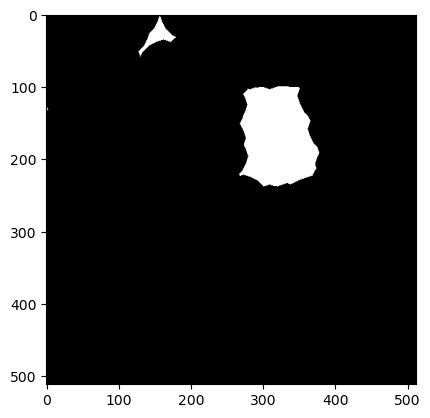

In [16]:
# Aplicamos ahora una erosión para limpiar la máscara
se3 = morph.disk(3)
u3_v_ero = cv2.erode(u3_v_thr_cl, se3, iterations=5)
plt.imshow(u3_v_ero, cmap='gray');

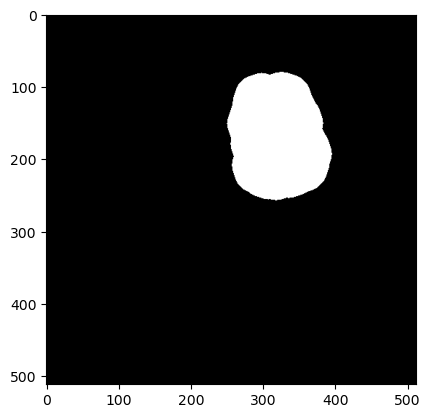

In [17]:
se3 = morph.disk(20)
u3_v_thr_op2 = cv2.morphologyEx(u3_v_ero, cv2.MORPH_OPEN, se3, iterations=1)
u3_mask = cv2.dilate(u3_v_thr_op2, morph.disk(5), iterations=4)
plt.imshow(u3_mask, cmap='gray');

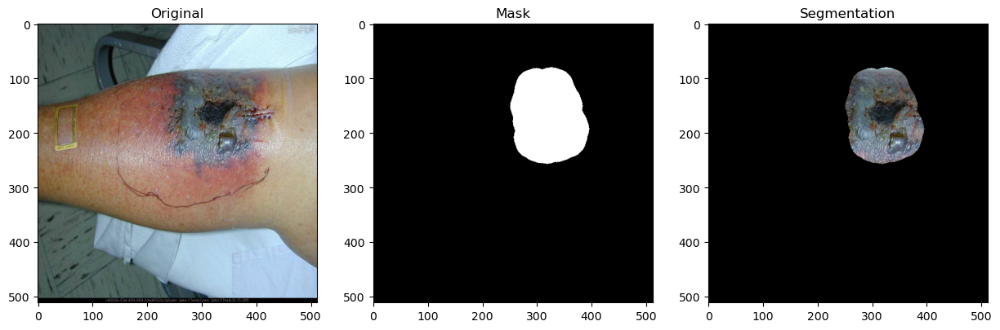

In [18]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u3_mask = u3_mask > 127
u3_segmented = u3_rgb * u3_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u3_rgb, u3_mask, u3_segmented)

## #4. U4

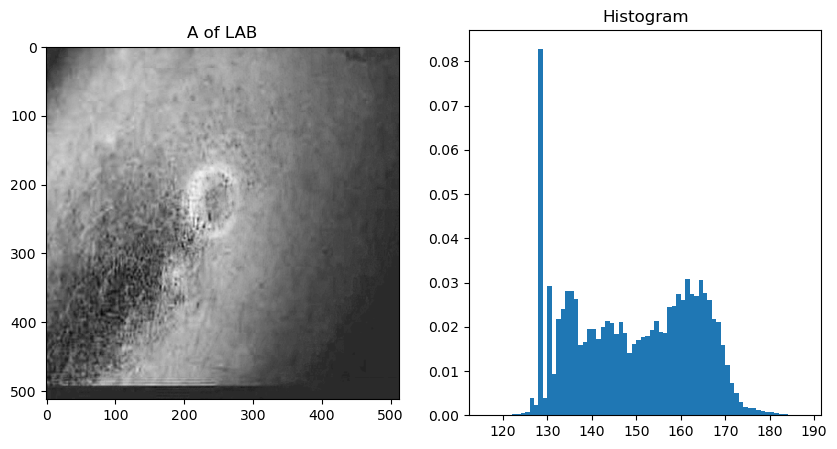

In [19]:
u4 = cv2.imread('Ulcers/U4.jpg')
u4_rgb = cv2.cvtColor(u4, cv2.COLOR_BGR2RGB)

# Se decide tras analizar los canales de color con el script, escoger el canal A del LAB
u4_a = cv2.cvtColor(u4, cv2.COLOR_BGR2LAB)[:,:,1]

show_img_channel_and_histogram(u4_a, 'A of LAB')

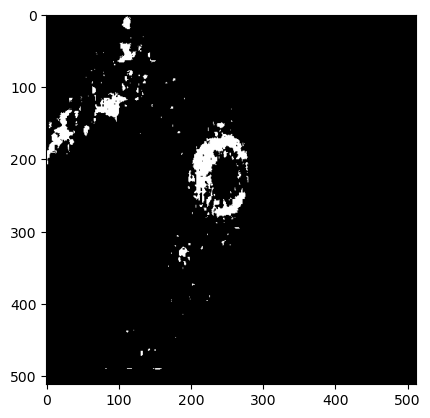

In [20]:
# Como la lesión es de alta intensidad, aplicamos un umbral de 174
_, u4_a_thr = cv2.threshold(u4_a, 170, 255, cv2.THRESH_BINARY)
plt.imshow(u4_a_thr, cmap='gray');

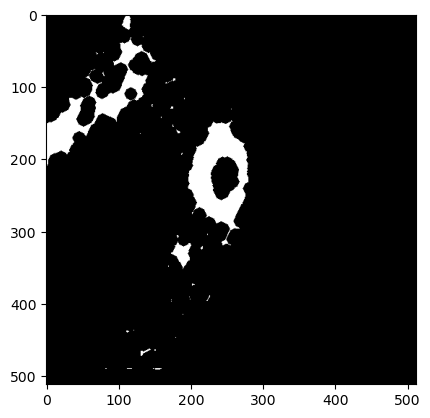

In [21]:
# Aplicamos ahora una operación morfológica de cierre para precisamente cerrar el área de la lesión
se4 = morph.disk(3)
u4_a_thr_cl = cv2.morphologyEx(u4_a_thr, cv2.MORPH_CLOSE, se4, iterations=3)
plt.imshow(u4_a_thr_cl, cmap='gray');

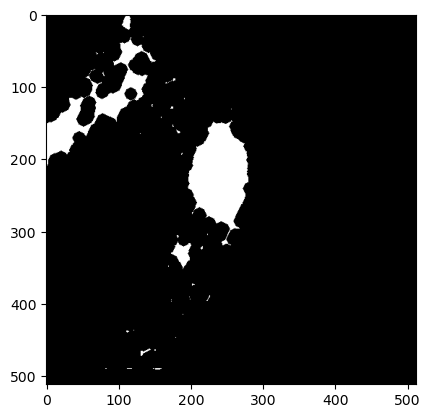

In [22]:
# Aplicamos un floodfill para rellenar el área de la lesión
u4_a_flood = morph.flood_fill(u4_a_thr_cl, (250,240), 255)
plt.imshow(u4_a_flood, cmap='gray');

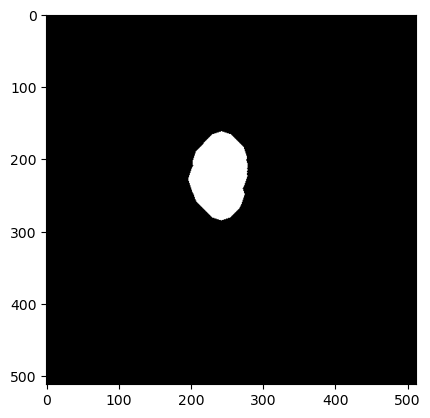

In [23]:
# Ahora aplicamoos una operación de apertura para limpiar la imagen
se4 = morph.disk(7)
u4_a_op = cv2.morphologyEx(u4_a_flood, cv2.MORPH_OPEN, se4, iterations=4)
plt.imshow(u4_a_op, cmap='gray');

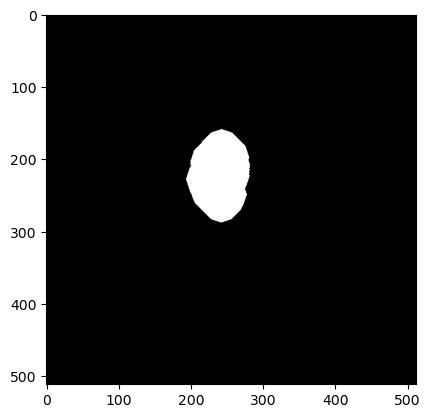

In [24]:
# Aplicamos una pequeña dilatación para mejorar la máscara
u4_mask = cv2.dilate(u4_a_op, morph.disk(3), iterations=1) > 127
plt.imshow(u4_mask, cmap='gray');

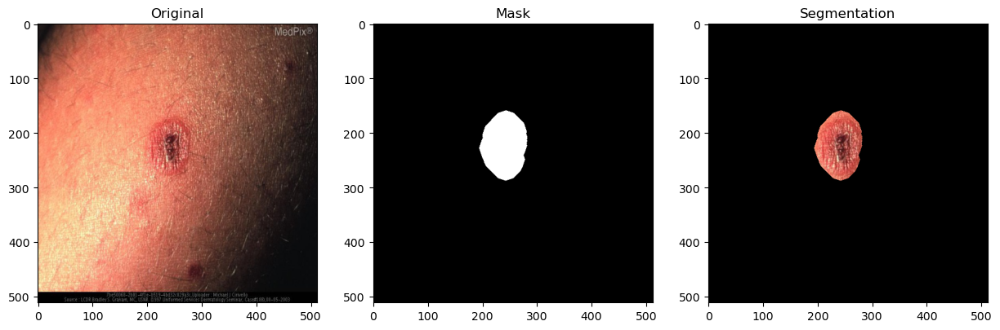

In [25]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u4_segmented = u4_rgb * u4_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u4_rgb, u4_mask, u4_segmented)

## #5. U5

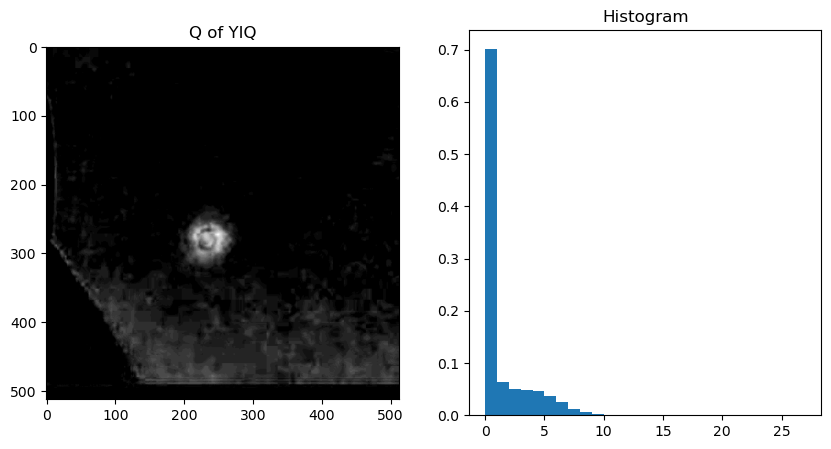

In [26]:
u5 = cv2.imread('Ulcers/U5.jpg')
u5_rgb = cv2.cvtColor(u5, cv2.COLOR_BGR2RGB)

# Se decide tras analizar los canales de color con el script, escoger el canal Q del YIQ
u5_q = np.clip((0.212*u5_rgb[:,:,0] - 0.523*u5_rgb[:,:,1] + 0.311*u5_rgb[:,:,2]), 0, 255).astype(np.uint8)

show_img_channel_and_histogram(u5_q, 'Q of YIQ')

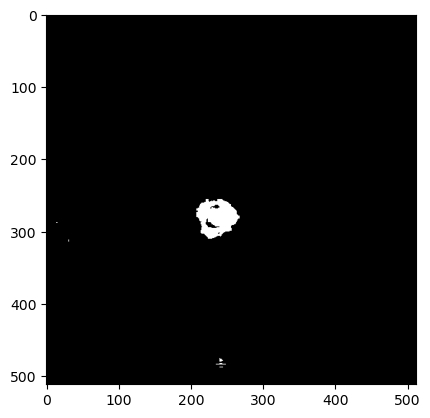

In [27]:
# La umbralización está muy sencilla, aplicamos una de 8
_, u5_q_thr = cv2.threshold(u5_q, 9, 255, cv2.THRESH_BINARY)
plt.imshow(u5_q_thr, cmap='gray');

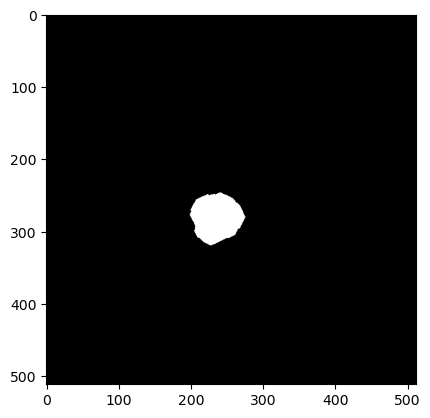

In [28]:
# Con operaiones morfológicas, limpiamos la imagen
se5 = morph.disk(3)
u5_q_op = cv2.morphologyEx(u5_q_thr, cv2.MORPH_OPEN, se5, iterations=1)
# Y ahora para pulir la máscara, aplicamos una de dilatación
se5 = morph.disk(3)
u5_mask = cv2.morphologyEx(u5_q_op, cv2.MORPH_DILATE, se5, iterations=3) > 127
plt.imshow(u5_mask, cmap='gray');

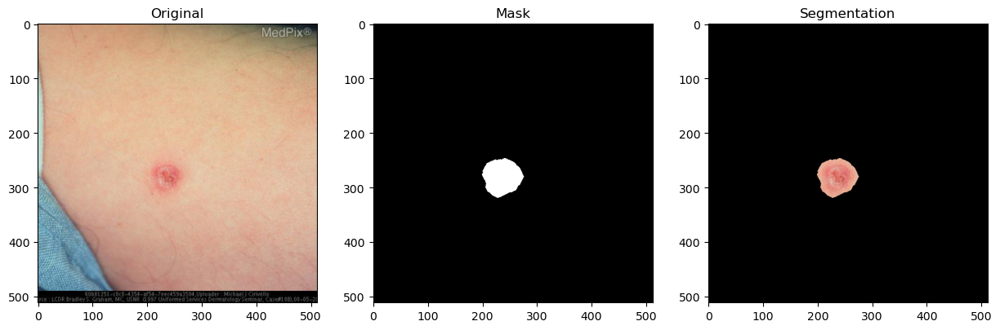

In [29]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u5_segmented = u5_rgb * u5_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u5_rgb, u5_mask, u5_segmented)

## #6. U6

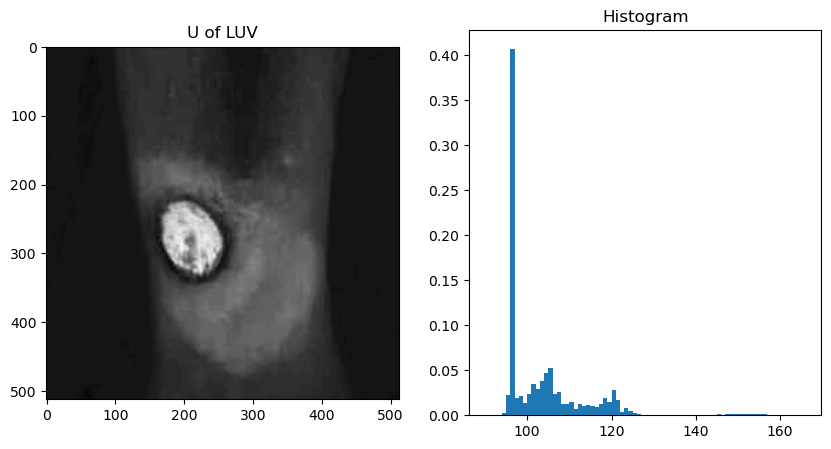

In [30]:
u6 = cv2.imread('Ulcers/U6.jpg')
u6_rgb = cv2.cvtColor(u6, cv2.COLOR_BGR2RGB)

# Se decide tras analizar los canales de color con el script, escoger el canal U de LUV
u6_u = cv2.cvtColor(u6, cv2.COLOR_BGR2LUV)[:,:,1]
show_img_channel_and_histogram(u6_u, 'U of LUV')

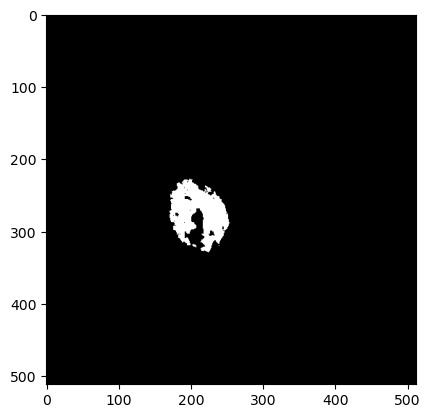

In [31]:
# La lesión cutánea tiene una alta intensidad, aplicamos entonces un umbral grande donde le histograma muestra unos pocos pixeles luego de 140
_, u6_u_thr = cv2.threshold(u6_u, 140, 255, cv2.THRESH_BINARY)
plt.imshow(u6_u_thr, cmap='gray');

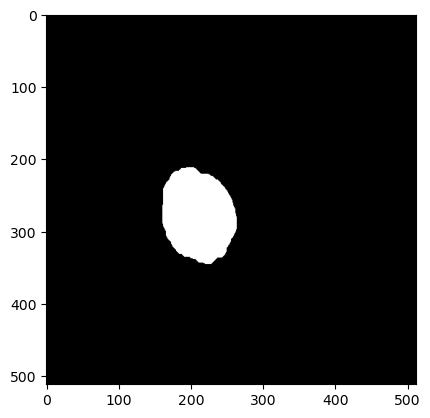

In [32]:
# Operación de cierre para mejorar la máscara
se6 = morph.ellipse(5, 7)
u6_u_thr_cl = cv2.morphologyEx(u6_u_thr, cv2.MORPH_CLOSE, se6, iterations=3)
# Aplicamos ahora un dilatación con estructura de elipse para mejorar la máscara
u6_mask = cv2.dilate(u6_u_thr_cl, morph.ellipse(5, 8), iterations=2) > 127
plt.imshow(u6_mask, cmap='gray');

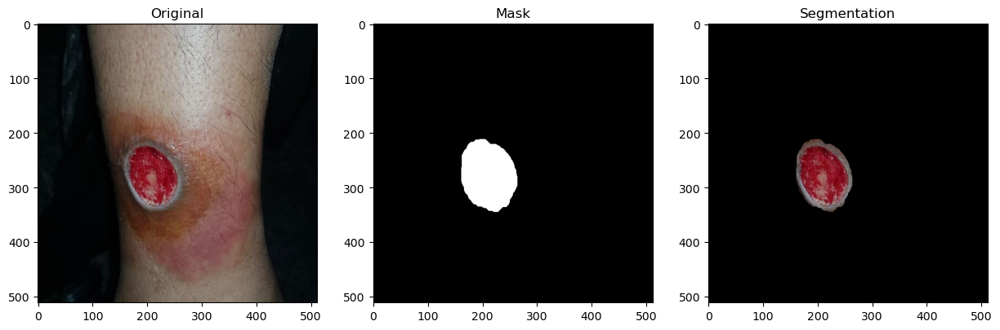

In [33]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u6_segmented = u6_rgb * u6_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u6_rgb, u6_mask, u6_segmented)

## #7. U7

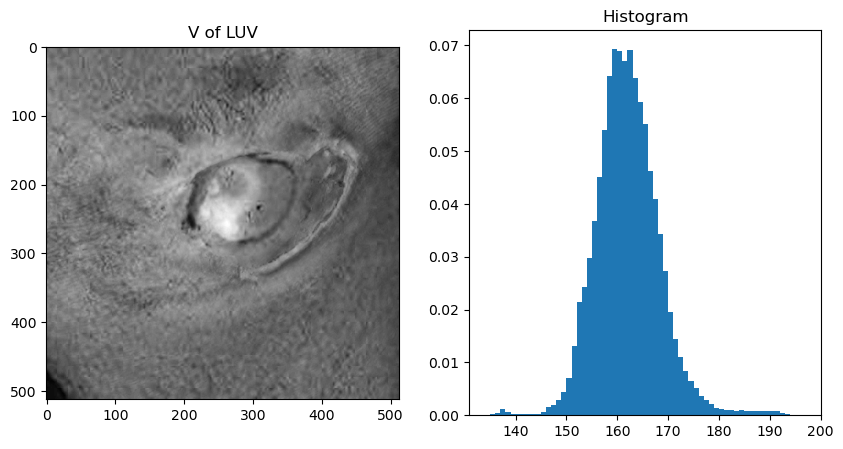

In [34]:
u7 = cv2.imread('Ulcers/U7.jpg')
u7_rgb = cv2.cvtColor(u7, cv2.COLOR_BGR2RGB)

# Se decide tras analizar los canales de color con el script, escoger el canal V de LUV
u7_v = cv2.cvtColor(u7, cv2.COLOR_BGR2LUV)[:,:,2]
show_img_channel_and_histogram(u7_v, 'V of LUV')

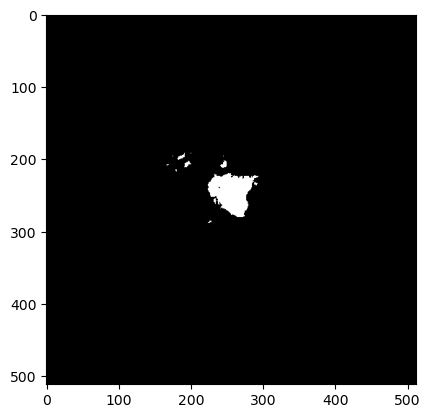

In [35]:
# Umbralizamos buscando rescatar la parte más intensa de la lesión
_, u7_v_thr = cv2.threshold(u7_v, 180, 255, cv2.THRESH_BINARY)
plt.imshow(u7_v_thr, cmap='gray');

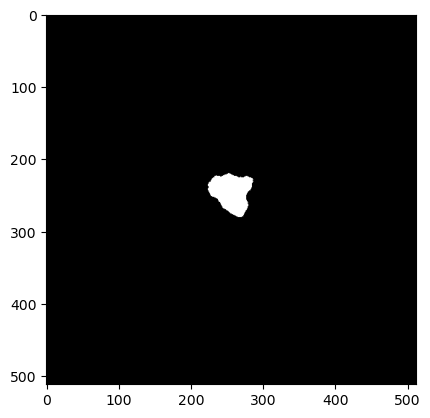

In [36]:
# Usamos una pequeña apertura para limpiar la imagen
se7 = morph.disk(3)
u7_v_op = cv2.morphologyEx(u7_v_thr, cv2.MORPH_OPEN, se7, iterations=1)
# Seguido de un cierre para mejorar la máscara
u7_v_cl = cv2.morphologyEx(u7_v_op, cv2.MORPH_CLOSE, se7, iterations=2)
plt.imshow(u7_v_cl, cmap='gray');

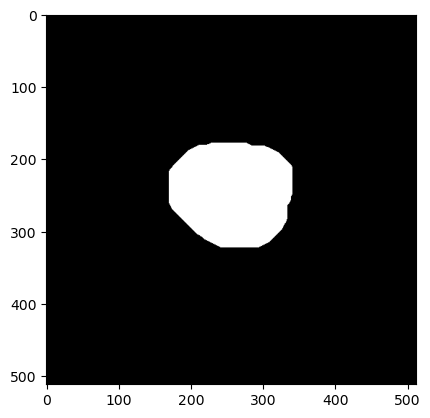

In [37]:
# APlicamos ahora dilateciones para mejorar la máscara
u7_mask = cv2.dilate(u7_v_cl, morph.ellipse(9,7), iterations=6) > 127
plt.imshow(u7_mask, cmap='gray');

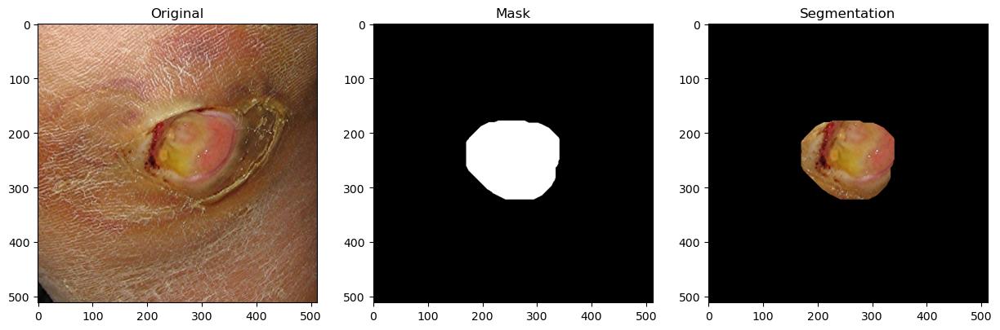

In [38]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u7_segmented = u7_rgb * u7_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u7_rgb, u7_mask, u7_segmented)

## #8. U8

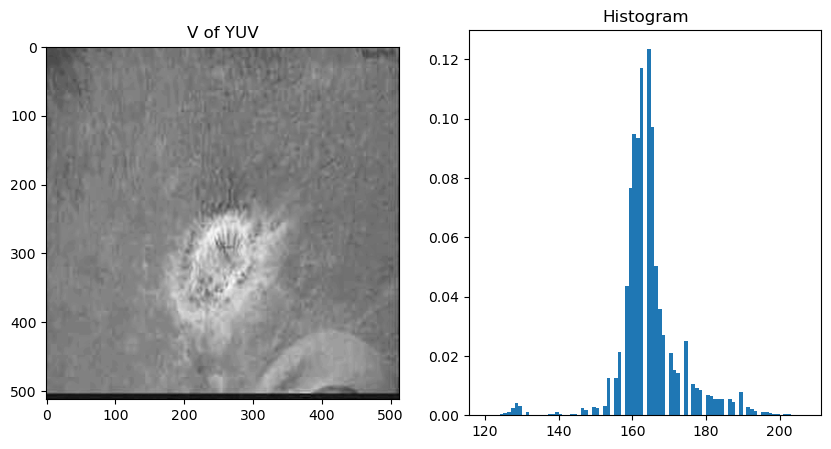

In [39]:
u8 = cv2.imread('Ulcers/U8.jpg')
u8_rgb = cv2.cvtColor(u8, cv2.COLOR_BGR2RGB)

# Se decide tras analizar los canales de color con el script, escoger el canal V de YUV
u8_v = cv2.cvtColor(u8, cv2.COLOR_BGR2YUV)[:,:,2]
show_img_channel_and_histogram(u8_v, 'V of YUV')

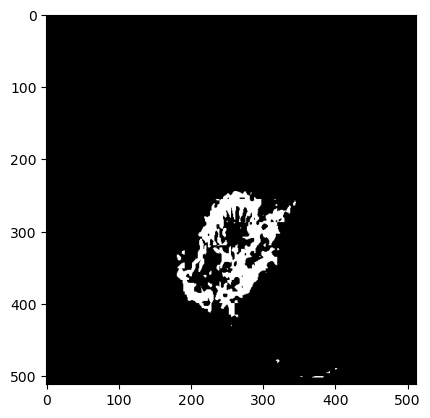

In [40]:
# Umbralización alta
_, u8_v_thr = cv2.threshold(u8_v, 183, 255, cv2.THRESH_BINARY)
plt.imshow(u8_v_thr, cmap='gray');

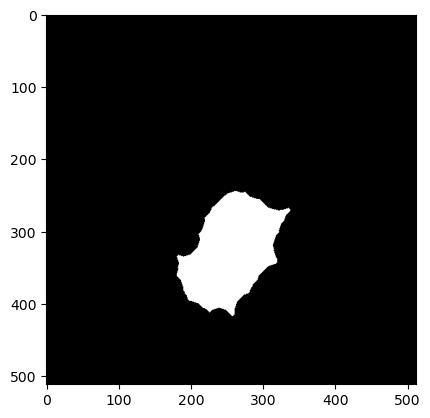

In [41]:
# Apertura para limpiar alrededores
se8 = morph.disk(2)
u8_v_op = cv2.morphologyEx(u8_v_thr, cv2.MORPH_OPEN, se8, iterations=1)
# Seguida de un cierre para definir la lesión
u8_v_cl = cv2.morphologyEx(u8_v_op, cv2.MORPH_CLOSE, morph.disk(7), iterations=3)
plt.imshow(u8_v_cl, cmap='gray');

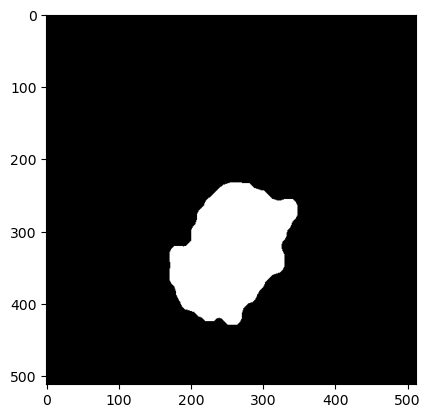

In [42]:
# Por último una dilatación para mejorar la máscara
u8_mask = cv2.dilate(u8_v_cl, morph.ellipse(5,6), iterations=2) > 127
plt.imshow(u8_mask, cmap='gray');

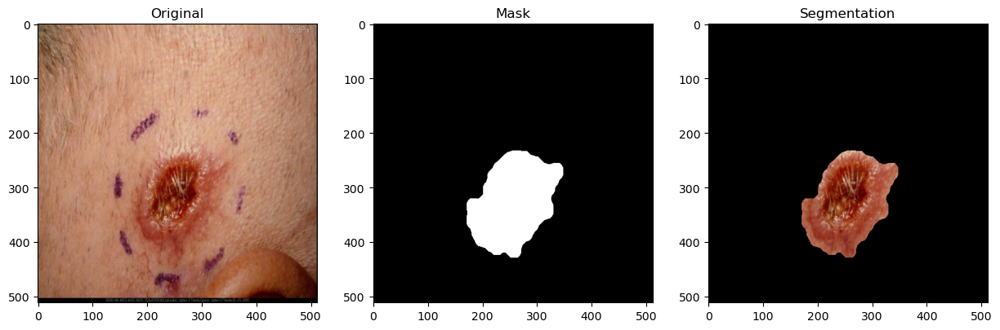

In [43]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u8_segmented = u8_rgb * u8_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u8_rgb, u8_mask, u8_segmented)

## #9. U9

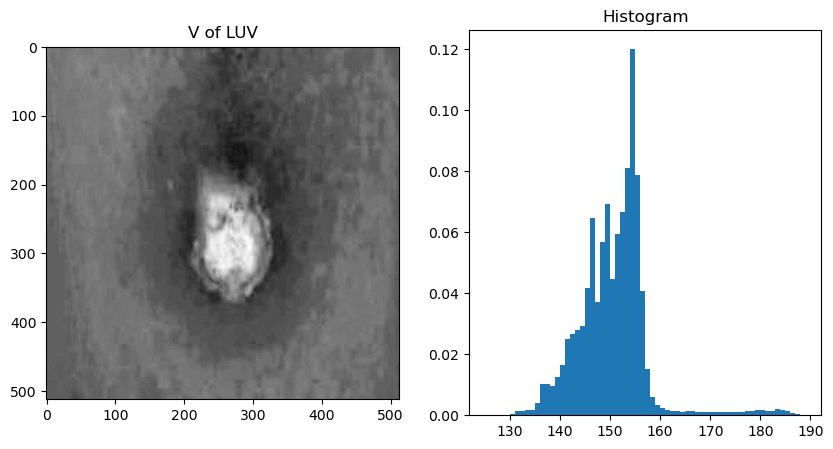

In [44]:
u9 = cv2.imread('Ulcers/U9.jpg')
u9_rgb = cv2.cvtColor(u9, cv2.COLOR_BGR2RGB)

# Escogemos el  V del LUV
u9_v = cv2.cvtColor(u9, cv2.COLOR_BGR2LUV)[:,:,2]
show_img_channel_and_histogram(u9_v, 'V of LUV')

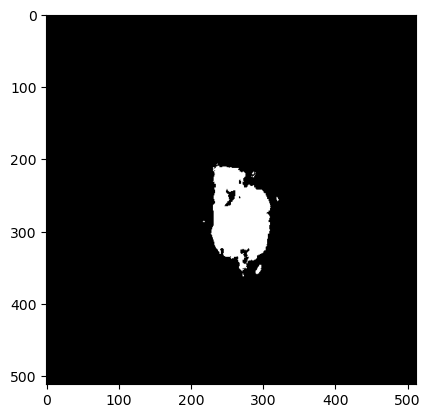

In [45]:
# La lesión es de una región de alta intensidad, apliquemos un umbral de 162 según el hisograma
_, u9_v_thr = cv2.threshold(u9_v, 162, 255, cv2.THRESH_BINARY)
plt.imshow(u9_v_thr, cmap='gray');

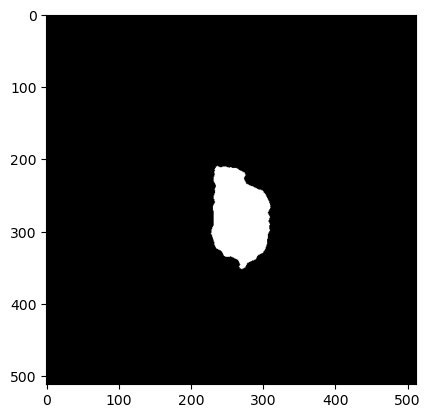

In [46]:
# Aplicamos una apertura para limpiar la imagen
se9 = morph.disk(3)
u9_v_op = cv2.morphologyEx(u9_v_thr, cv2.MORPH_OPEN, se9, iterations=1)
# Ahora un cierre
u9_v_cl = cv2.morphologyEx(u9_v_op, cv2.MORPH_CLOSE, se9, iterations=3)
plt.imshow(u9_v_cl, cmap='gray');

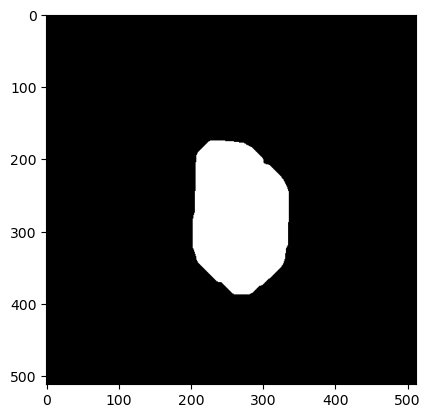

In [47]:
# Dilatación con estructura de elipse
u9_mask = cv2.dilate(u9_v_cl, morph.ellipse(5,7), iterations=5) > 127
plt.imshow(u9_mask, cmap='gray');

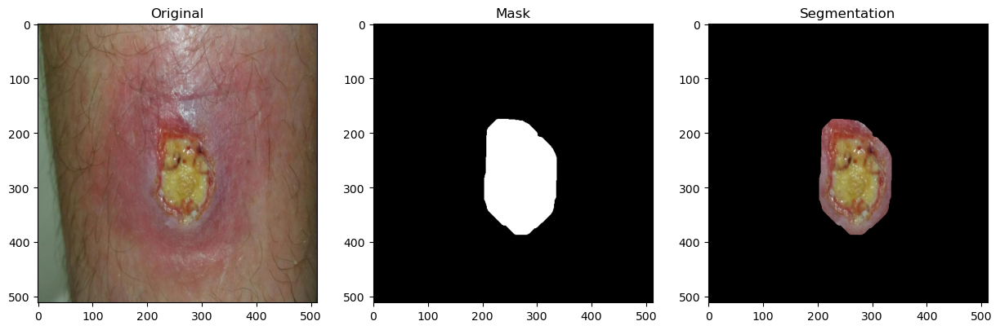

In [48]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u9_segmented = u9_rgb * u9_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u9_rgb, u9_mask, u9_segmented)

## #10. U10

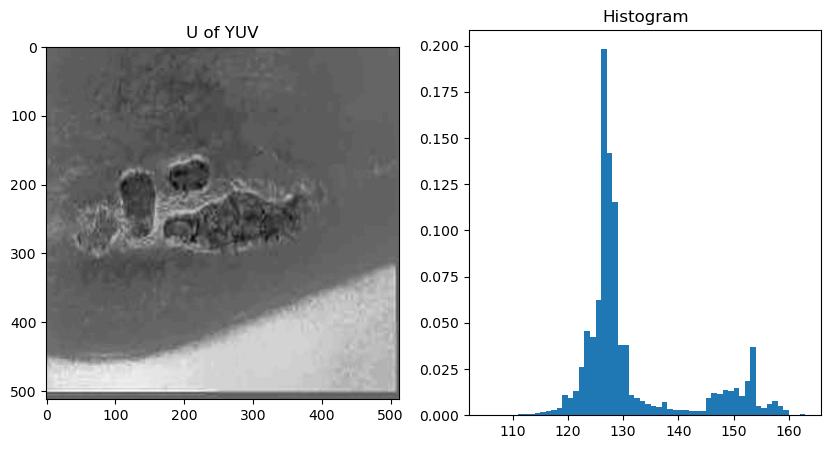

In [49]:
u10 = cv2.imread('Ulcers/U10.jpg')
u10_rgb = cv2.cvtColor(u10, cv2.COLOR_BGR2RGB)

# Escogemos canal U del YUV
u10_u = cv2.cvtColor(u10, cv2.COLOR_BGR2YUV)[:,:,1]
show_img_channel_and_histogram(u10_u, 'U of YUV')

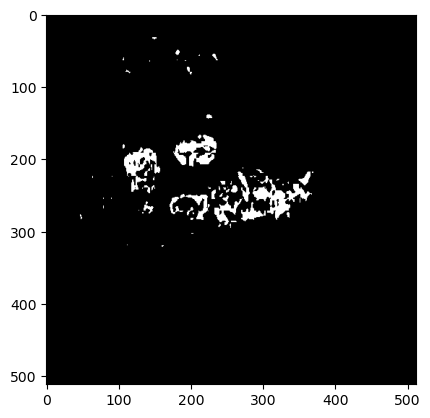

In [50]:
# Las lesiones están en una zona de baja intensidad, aplicamos un umbral de 120 invertido
_, u10_u_thr = cv2.threshold(u10_u, 119, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u10_u_thr, cmap='gray');

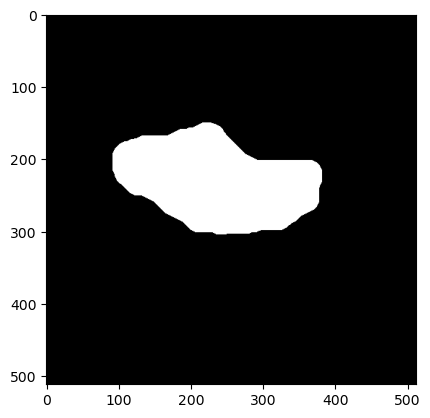

In [51]:
# Aplicamos una apertura para limpiar la imagen
se10 = morph.disk(3)
u10_u_op = cv2.morphologyEx(u10_u_thr, cv2.MORPH_OPEN, se10, iterations=1)
# Ahora un cierre para unir las lesiones, usando una estructura de elipse
u10_u_cl = cv2.morphologyEx(u10_u_op, cv2.MORPH_CLOSE, morph.ellipse(9,7), iterations=10)
# Ahora unas cuantas dilataciones para mejorar la máscara
u10_mask = cv2.dilate(u10_u_cl, morph.ellipse(8,9), iterations=2) > 127
plt.imshow(u10_mask, cmap='gray');

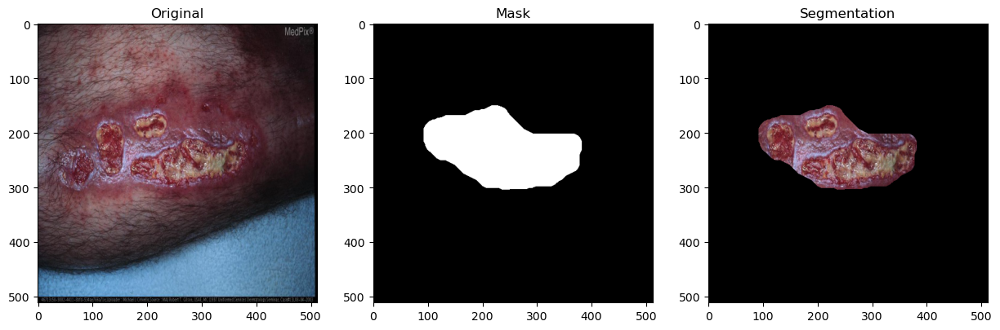

In [52]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u10_segmented = u10_rgb * u10_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u10_rgb, u10_mask, u10_segmented)

## #11. U11

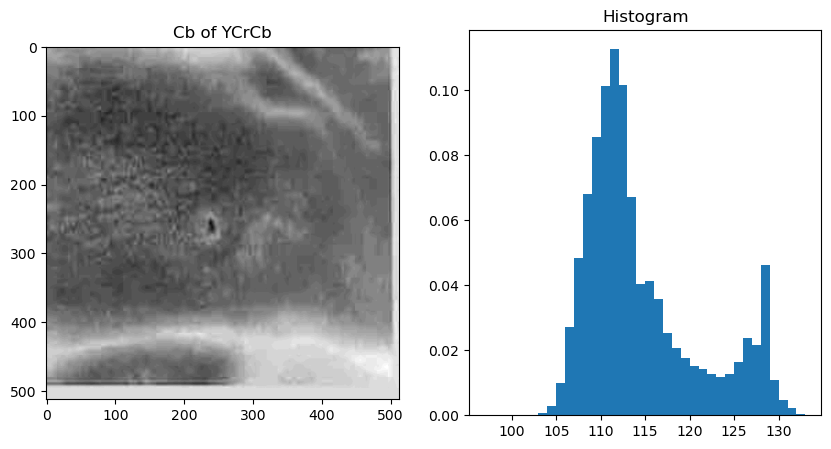

In [53]:
u11 = cv2.imread('Ulcers/U11.jpg')
u11_rgb = cv2.cvtColor(u11, cv2.COLOR_BGR2RGB)

# Escogemos el Cb del YCrCb
u11_cb = cv2.cvtColor(u11, cv2.COLOR_BGR2YCrCb)[:,:,2]
show_img_channel_and_histogram(u11_cb, 'Cb of YCrCb')

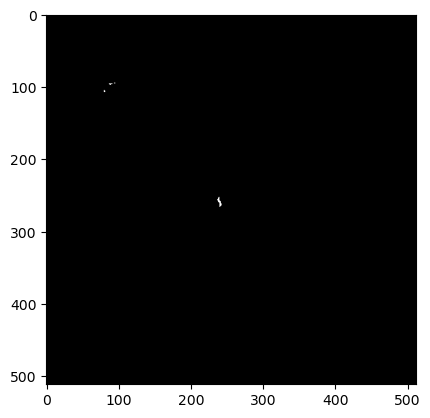

In [54]:
# La lesión está en una región de baja intensidad, aplicamos un umbral de 120 invertido
_, u11_cb_thr = cv2.threshold(u11_cb, 102, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u11_cb_thr, cmap='gray');

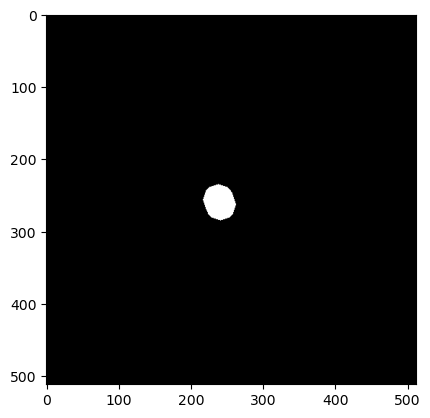

In [55]:
# Aplicamos una apertura pequeña para limpiar la imagen
u11_cb_op = cv2.morphologyEx(u11_cb_thr, cv2.MORPH_OPEN, morph.disk(1), iterations=1)
# Tenuamente tenemos la forma de la lesión, aplicamos entonces una dilatación de elipse vertical para recuperar la forma
u11_mask = cv2.dilate(u11_cb_op, morph.disk(5), iterations=4) > 127
plt.imshow(u11_mask, cmap='gray');

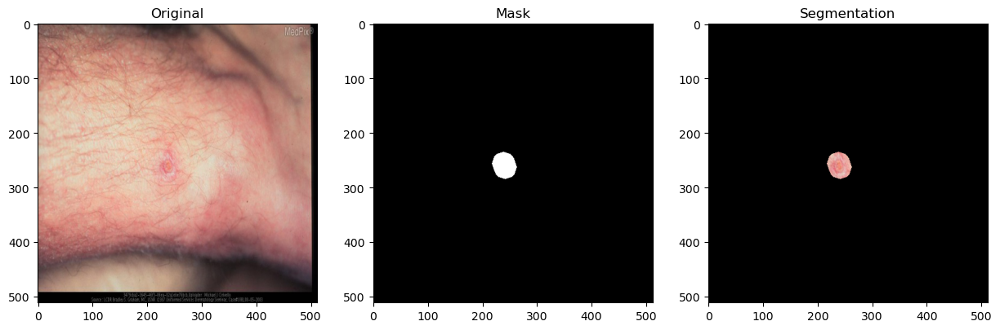

In [56]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u11_segmented = u11_rgb * u11_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u11_rgb, u11_mask, u11_segmented)

## #12. U12

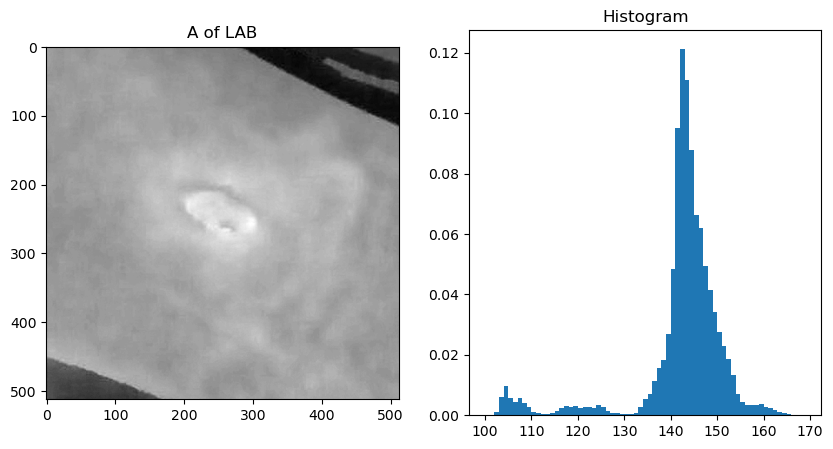

In [57]:
u12 = cv2.imread('Ulcers/U12.png')
u12_rgb = cv2.cvtColor(u12, cv2.COLOR_BGR2RGB)

# Escogemos el canal A del LAB
u12_a = cv2.cvtColor(u12, cv2.COLOR_BGR2LAB)[:,:,1]
show_img_channel_and_histogram(u12_a, 'A of LAB')

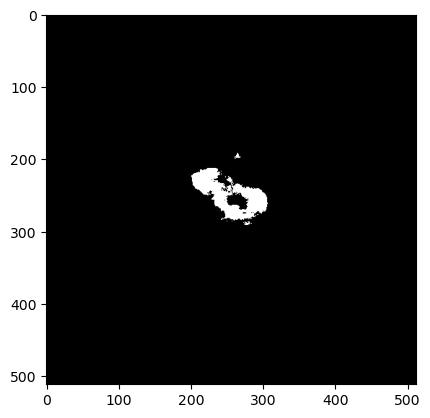

In [58]:
# La lesión está en una región de alta intensidad, aplicamos un umbral de 160
_, u12_a_thr = cv2.threshold(u12_a, 158, 255, cv2.THRESH_BINARY)
plt.imshow(u12_a_thr, cmap='gray');

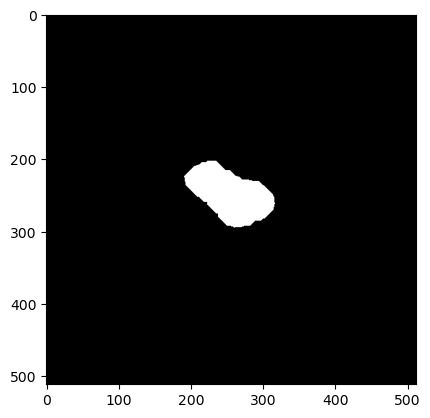

In [59]:
# Primero una pequeña paertura para limpiar la imagen
u12_a_op = cv2.morphologyEx(u12_a_thr, cv2.MORPH_OPEN, morph.disk(2), iterations=1)
# Aplicamos un cierre para dejar bien definida el área de la lesion
u12_a_cl = cv2.morphologyEx(u12_a_op, cv2.MORPH_CLOSE, morph.ellipse(4,6), iterations=4)
# Ahora una dilatación para mejorar la máscara
u12_mask = cv2.dilate(u12_a_cl, morph.disk(2), iterations=5) > 127
plt.imshow(u12_mask, cmap='gray');

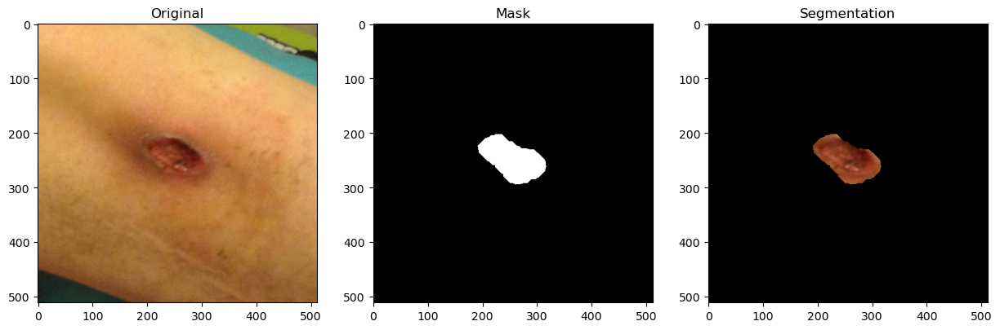

In [60]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u12_segmented = u12_rgb * u12_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u12_rgb, u12_mask, u12_segmented)

## #13. U13

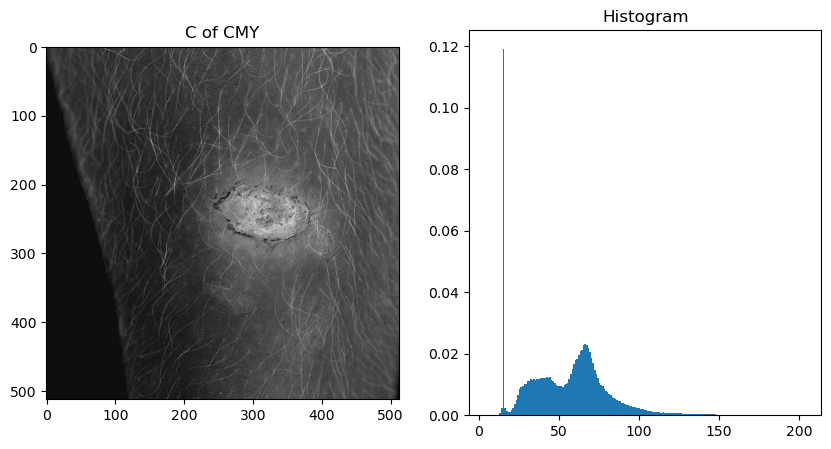

In [61]:
u13 = cv2.imread('Ulcers/U13.jpg')
u13_rgb = cv2.cvtColor(u13, cv2.COLOR_BGR2RGB)

# Escogemos el canal C del CMY
u13_c = np.clip((255 - u13_rgb[:,:,0]), 0, 255).astype(np.uint8)
show_img_channel_and_histogram(u13_c, 'C of CMY')

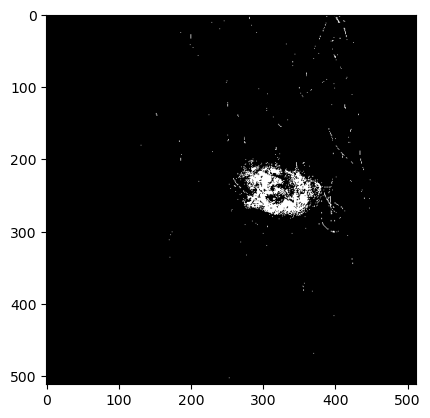

In [62]:
# La lesión tiene una alta intensidad, aplicamos un umbral de 110
_, u13_q_thr = cv2.threshold(u13_c, 120, 255, cv2.THRESH_BINARY)
plt.imshow(u13_q_thr, cmap='gray');

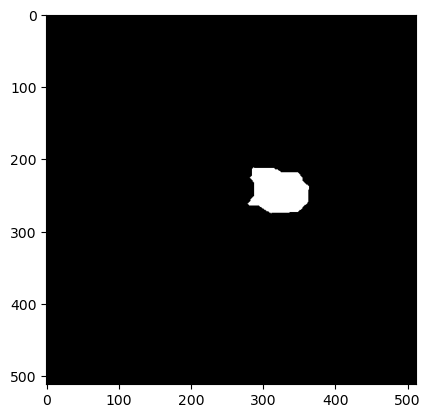

In [63]:
# APlicamos una apertura para limpiar la imagen
se13 = morph.disk(2)
u13_q_op = cv2.morphologyEx(u13_q_thr, cv2.MORPH_OPEN, se13, iterations=1)
# Seguidos de unas de cierre para mejorar la máscara
u13_q_cl = cv2.morphologyEx(u13_q_op, cv2.MORPH_CLOSE, morph.ellipse(9,6), iterations=3)
plt.imshow(u13_q_cl, cmap='gray');

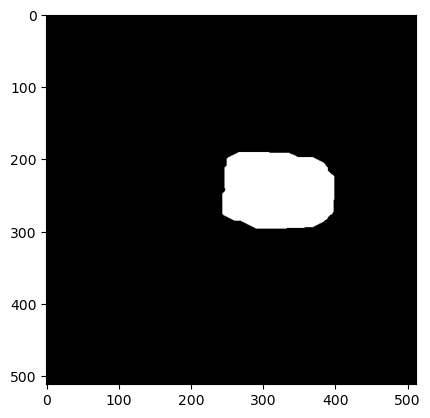

In [64]:
# Finalmente aplicamos unas dilataciones
u13_mask = cv2.dilate(u13_q_cl, morph.ellipse(5,3), iterations=7) > 127
plt.imshow(u13_mask, cmap='gray');

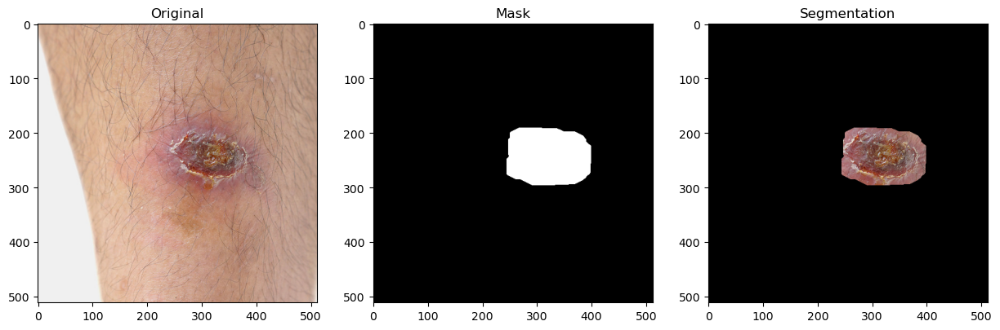

In [65]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u13_segmented = u13_rgb * u13_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u13_rgb, u13_mask, u13_segmented)

## #14. U14

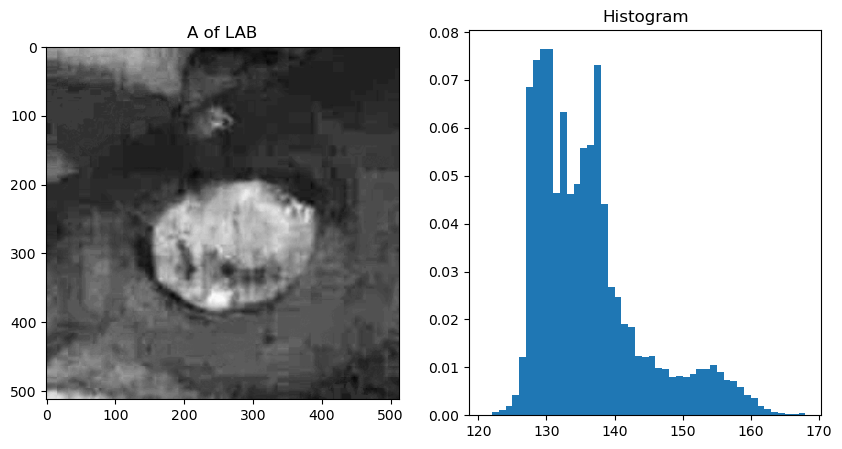

In [66]:
u14 = cv2.imread('Ulcers/U14.jpg')
u14_rgb = cv2.cvtColor(u14, cv2.COLOR_BGR2RGB)

# Analizando los canales de color con el script, esgogemos el A del LAB
u14_a = cv2.cvtColor(u14, cv2.COLOR_BGR2LAB)[:,:,1]
show_img_channel_and_histogram(u14_a, 'A of LAB')

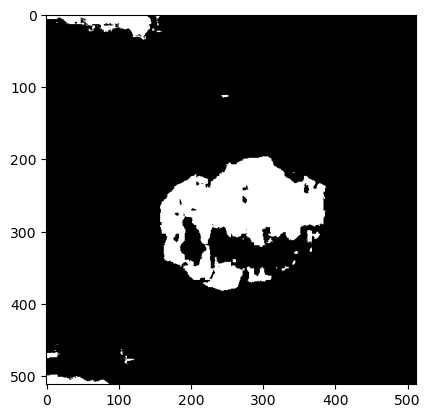

In [67]:
# La lesión está en una región de alta intensidad, aplicamos un umbral de 160
_, u14_a_thr = cv2.threshold(u14_a, 148, 255, cv2.THRESH_BINARY)
plt.imshow(u14_a_thr, cmap='gray');

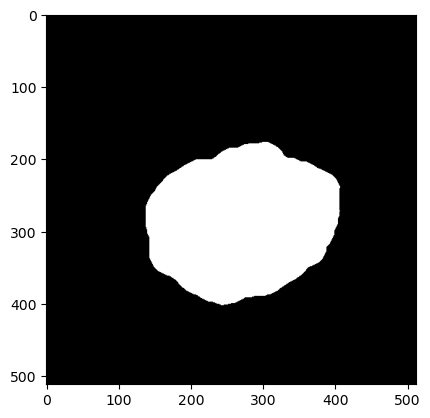

In [68]:
# Hacemos un cierre para unir la estructura de la lesión
se14 = morph.ellipse(8, 7)
u14_a_cl = cv2.morphologyEx(u14_a_thr, cv2.MORPH_CLOSE, se14, iterations=5)
# Hacemos un remove small objects para limpiar la imagen
u14_mask = morph.remove_small_objects(u14_a_cl > 127, min_size=6000)
# Hacemos ahora una dilatación para mejorar la máscara
u14_mask = (cv2.dilate(u14_mask.astype(np.uint8), morph.disk(4), iterations=5)).astype(bool)
plt.imshow(u14_mask, cmap='gray');

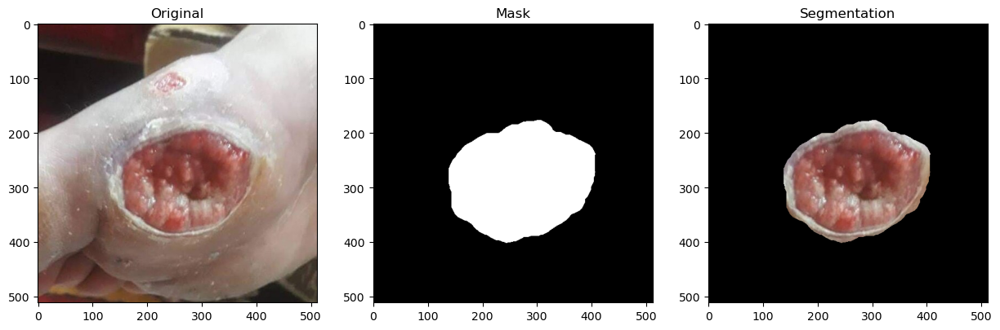

In [69]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u14_segmented = u14_rgb * u14_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u14_rgb, u14_mask, u14_segmented)

## #15. U15

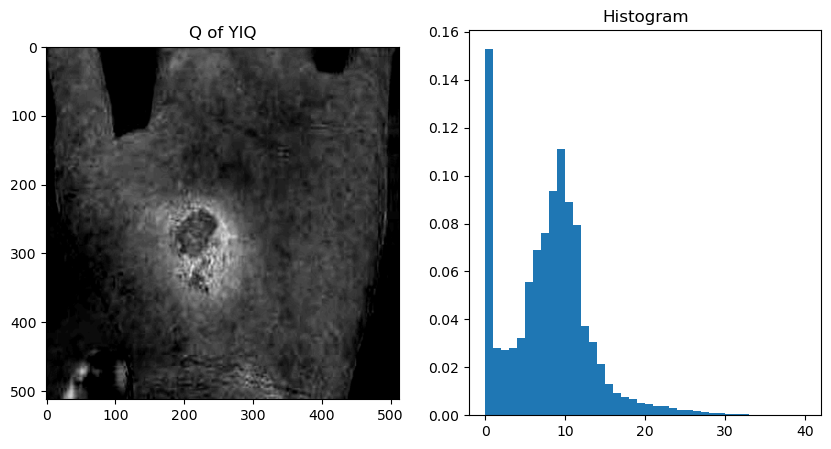

In [70]:
u156 = cv2.imread('Ulcers/U15.jpg')
u15_rgb = cv2.cvtColor(u156, cv2.COLOR_BGR2RGB)

# Tras analizar, vamos a usar el Q del YIQ
u15_q = np.clip((0.212*u15_rgb[:,:,0] - 0.523*u15_rgb[:,:,1] + 0.311*u15_rgb[:,:,2]), 0, 255).astype(np.uint8)
show_img_channel_and_histogram(u15_q, 'Q of YIQ')

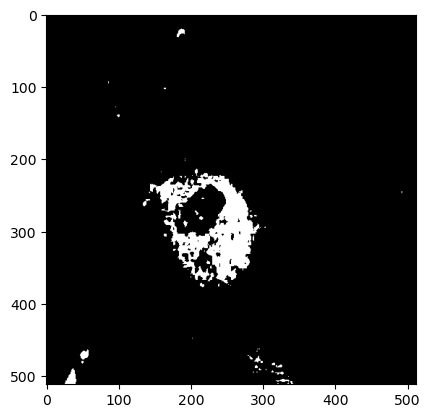

In [71]:
# Aplicamos un umbral relativametne alto de 15
_, u15_q_thr = cv2.threshold(u15_q, 17, 255, cv2.THRESH_BINARY)
plt.imshow(u15_q_thr, cmap='gray');

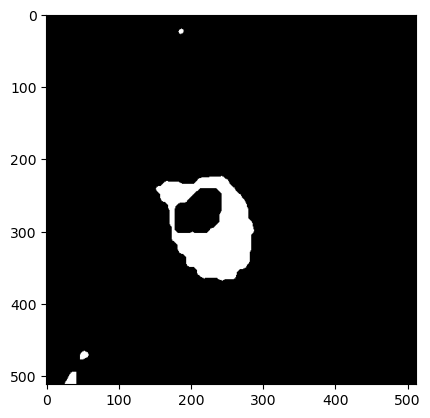

In [72]:
# Ahora aplicamos una apertura ligera para limpiar
se15 = morph.disk(3)
u15_q_op = cv2.morphologyEx(u15_q_thr, cv2.MORPH_OPEN, se15, iterations=1)
# Aplicamos ahora un cierre para unir la lesión
u15_q_cl = cv2.morphologyEx(u15_q_op, cv2.MORPH_CLOSE, morph.ellipse(3,4), iterations=4)
plt.imshow(u15_q_cl, cmap='gray');

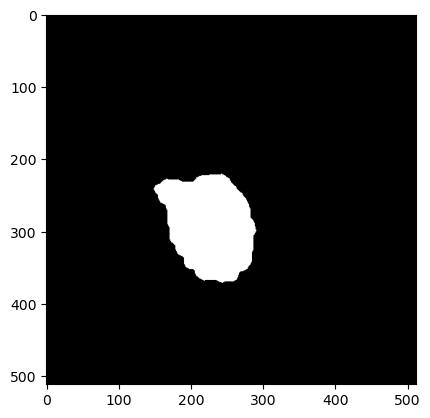

In [73]:
# Hacemos ahora un flodfill para rellenar la lesión poniendo un pixel semilla en (270,220)
u15_q_flood = morph.flood_fill(u15_q_cl, (270,220), 255)
# Seguido de un remove small objects para limpiar la imagen
u15_pre_mask = morph.remove_small_objects(u15_q_flood > 127, min_size=500)
# Pulimos un poco con un disco y dilatación
u15_mask = (cv2.dilate(u15_pre_mask.astype(np.uint8), morph.disk(3), iterations=1)).astype(bool)
plt.imshow(u15_mask, cmap='gray');

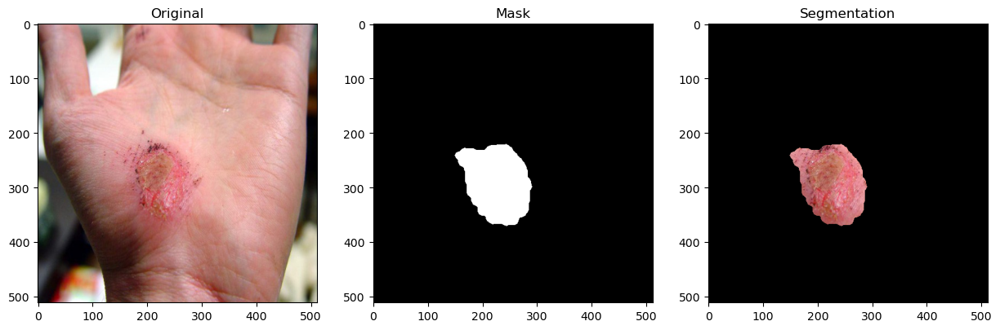

In [74]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u15_segmented = u15_rgb * u15_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u15_rgb, u15_mask, u15_segmented)

## #16. U16


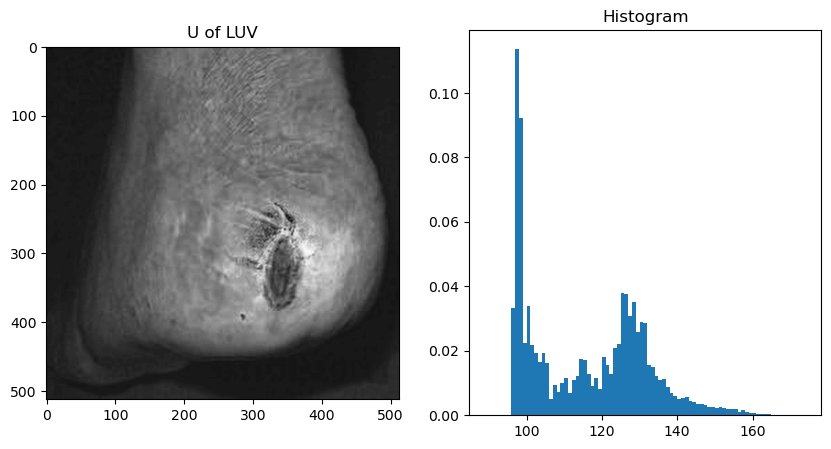

In [75]:
u16 = cv2.imread('Ulcers/U16.jpg')
u16_rgb = cv2.cvtColor(u16, cv2.COLOR_BGR2RGB)

# Tras analizar con el script de color channel visualizer, escogemos el U del Luv
u16_u = cv2.cvtColor(u16, cv2.COLOR_BGR2LUV)[:,:,1]
show_img_channel_and_histogram(u16_u, 'U of LUV')


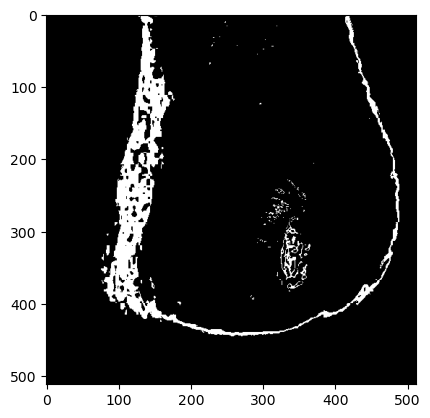

In [76]:
# Para segmentar usamos umbral bilateral, considerando que la intensidad de lesión es media
_, u16_u_thr1 = cv2.threshold(u16_u, 110, 255, cv2.THRESH_BINARY)
_, u16_u_thr2 = cv2.threshold(u16_u, 115, 255, cv2.THRESH_BINARY_INV)
u16_u_thr = cv2.bitwise_and(u16_u_thr1, u16_u_thr2)
plt.imshow(u16_u_thr, cmap='gray');

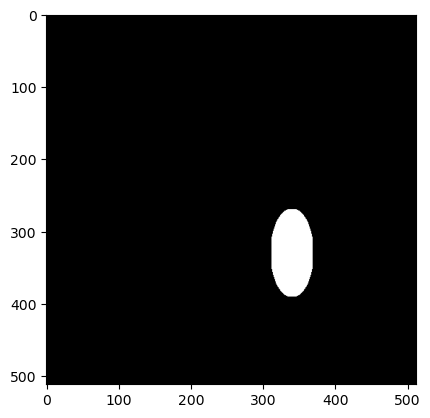

In [77]:
""" La umbralización no deja un resultado trabajable con operaciones morfológicas, por lo que se decide
usar un píxel semilla y como lo lesión tiene una forma de elipse vertical, se hace dilatación con una estructura así"""
se16 = morph.ellipse(14, 30)
u16_base = np.zeros_like(u16_u_thr)
u16_base[330,340] = 255
u16_mask = cv2.dilate(u16_base, se16, iterations=2) > 127
plt.imshow(u16_mask, cmap='gray');

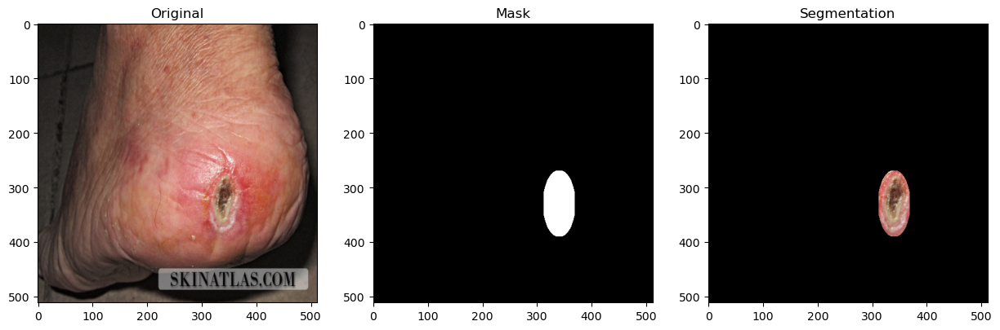

In [78]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u16_segmented = u16_rgb * u16_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u16_rgb, u16_mask, u16_segmented)

## #17. U17

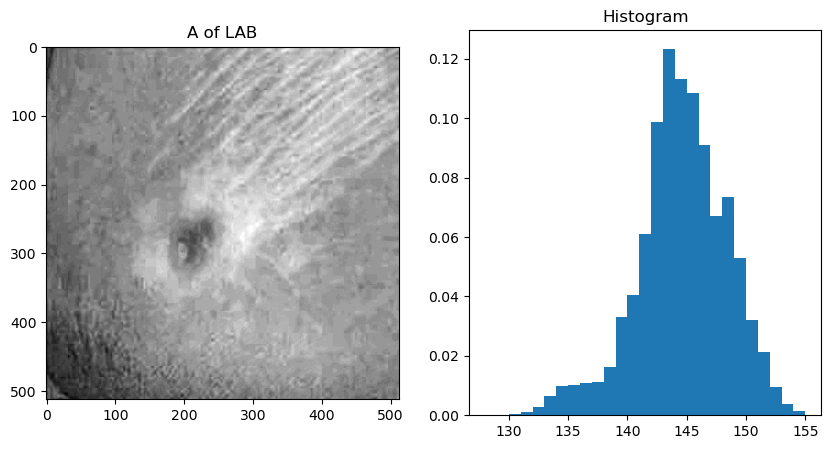

In [79]:
u17 = cv2.imread('Ulcers/U17.jpg')
u17_rgb = cv2.cvtColor(u17, cv2.COLOR_BGR2RGB)

# Tras analizar con el script de color channel visualizer, escogemos el A del LAB
u17_a = cv2.cvtColor(u17, cv2.COLOR_BGR2LAB)[:,:,1]
show_img_channel_and_histogram(u17_a, 'A of LAB')

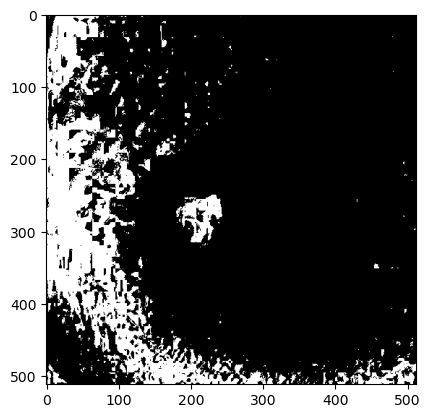

In [80]:
# Aplicamos umbral bilateral, pues la lesión es de intensidad media
_, u17_a_thr1 = cv2.threshold(u17_a, 136, 255, cv2.THRESH_BINARY)
_, u17_a_thr2 = cv2.threshold(u17_a, 141, 255, cv2.THRESH_BINARY_INV)
u17_a_thr = cv2.bitwise_and(u17_a_thr1, u17_a_thr2)
plt.imshow(u17_a_thr, cmap='gray');

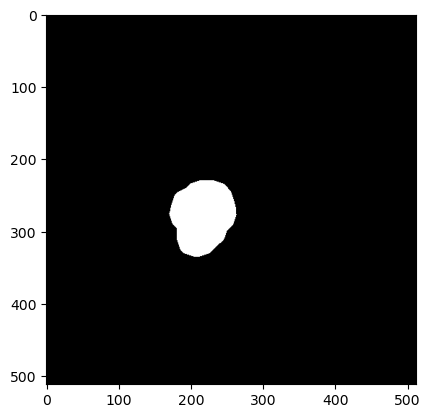

In [81]:
# Trabajamos con operaciones morfológicas, comenzando con una apertura para limpiar
u17_a_thr[:,0:150] = 0
u17_a_thr[400:,:] = 0
se17 = morph.disk(3)
u17_a_op = cv2.morphologyEx(u17_a_thr, cv2.MORPH_OPEN, se17, iterations=1)
# Seguida de un cierre para unir la lesión
u17_a_cl = cv2.morphologyEx(u17_a_op, cv2.MORPH_CLOSE, morph.ellipse(10,7), iterations=5)
# Hacemos un remove small objects para limpiar la imagen
u17_mask = morph.remove_small_objects(u17_a_cl.astype(bool), min_size=500)
# Y ahora una dilatación para mejorar la máscara
u17_mask = (cv2.dilate(u17_mask.astype(np.uint8), morph.disk(5), iterations=4)).astype(bool)
plt.imshow(u17_mask, cmap='gray');

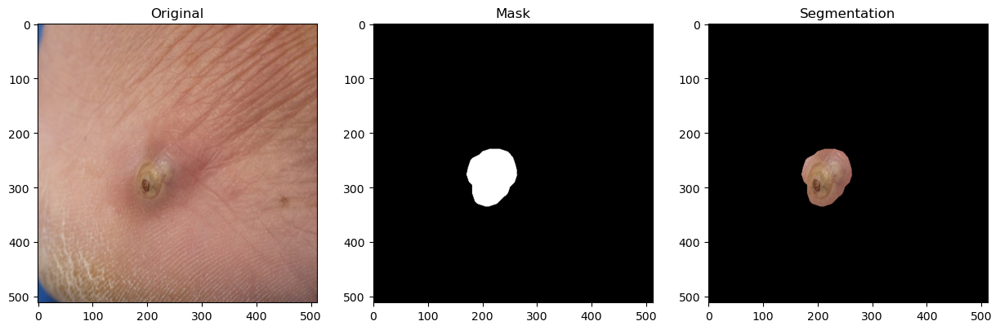

In [82]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u17_segmented = u17_rgb * u17_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u17_rgb, u17_mask, u17_segmented)

## #18. U18

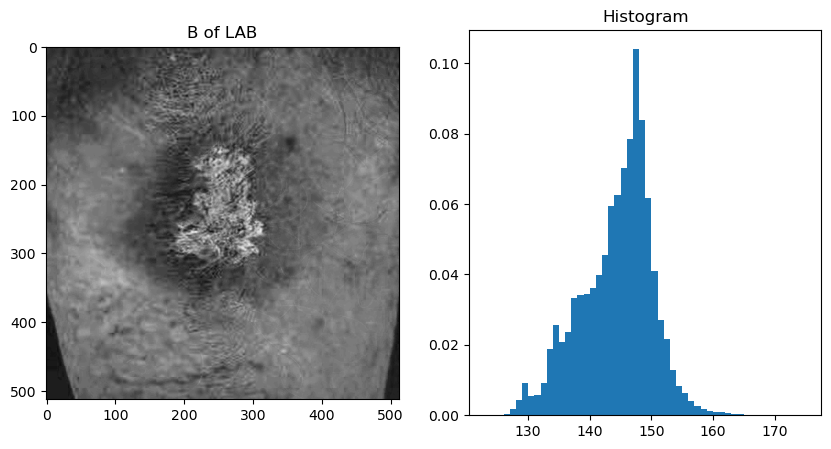

In [83]:
u18 = cv2.imread('Ulcers/U18.jpg')
u18_rgb = cv2.cvtColor(u18, cv2.COLOR_BGR2RGB)

# Escogemos el B del LAB según el análisis del script
u18_a = cv2.cvtColor(u18, cv2.COLOR_BGR2LAB)[:,:,2]
show_img_channel_and_histogram(u18_a, 'B of LAB')

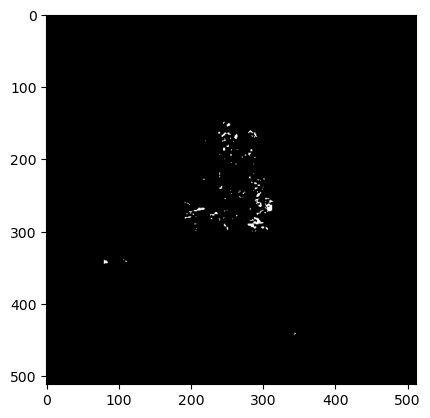

In [84]:
# Le lesión es de alta intensidad en este canal de color, aplicamos un umbral alto de 153
_, u18_a_thr = cv2.threshold(u18_a, 160, 255, cv2.THRESH_BINARY)
plt.imshow(u18_a_thr, cmap='gray');

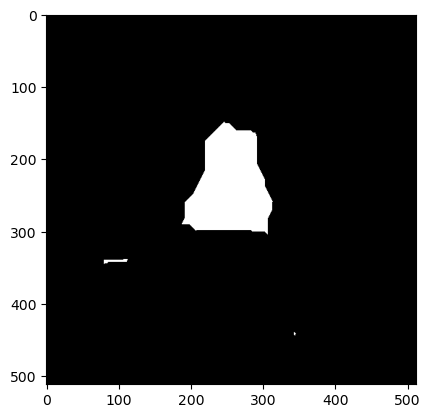

In [85]:
# Vamos aplicar operaciones morfológicas, comenzando con un cierre de elipse vertical para unir el área de la lesión
se18 = morph.ellipse(8, 13)
u18_a_cl = cv2.morphologyEx(u18_a_thr, cv2.MORPH_CLOSE, se18, iterations=8)
plt.imshow(u18_a_cl, cmap='gray');

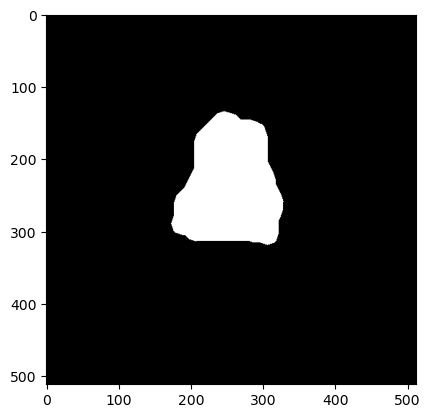

In [86]:
# Aplicamos un remove small objects para limpiar la imagen
u18_mask = morph.remove_small_objects(u18_a_cl > 127, min_size=500)
# Y ahora una dilatación para mejorar la máscara
u18_mask = (cv2.dilate(u18_mask.astype(np.uint8), morph.disk(5), iterations=3)).astype(bool)
plt.imshow(u18_mask, cmap='gray');

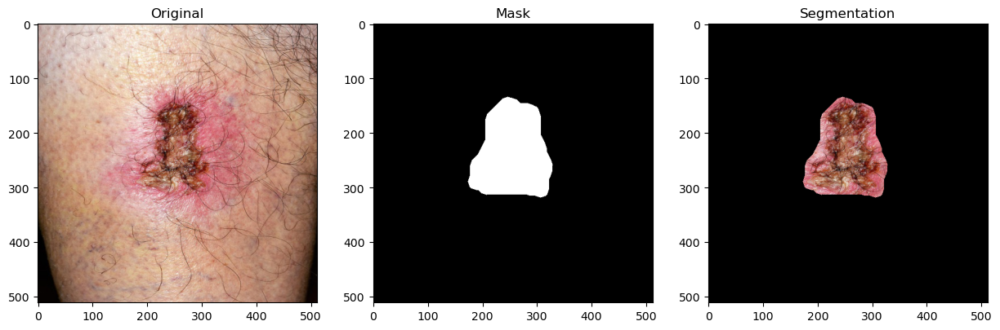

In [87]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u18_segmented = u18_rgb * u18_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u18_rgb, u18_mask, u18_segmented)

## #19. U19

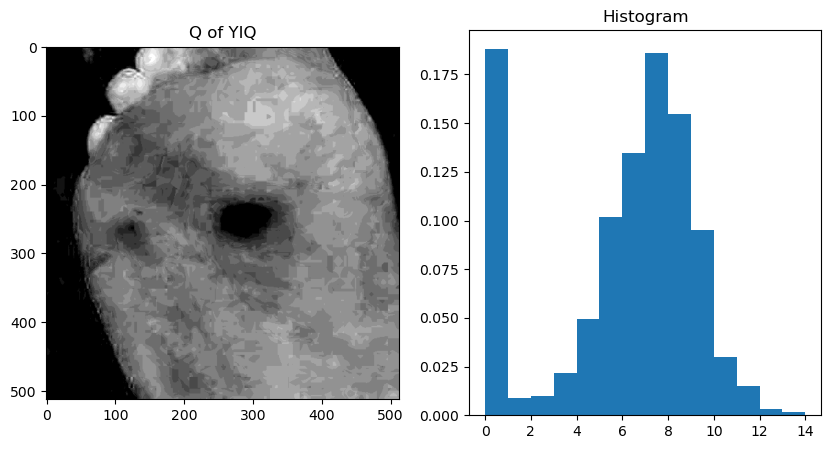

In [88]:
u19 = cv2.imread('Ulcers/U19.jpg')
u19_rgb = cv2.cvtColor(u19, cv2.COLOR_BGR2RGB)

# Escogemos el Q del YIQ
u19_q = np.clip((0.212*u19_rgb[:,:,0] - 0.523*u19_rgb[:,:,1] + 0.311*u19_rgb[:,:,2]), 0, 255).astype(np.uint8)
show_img_channel_and_histogram(u19_q, 'Q of YIQ')

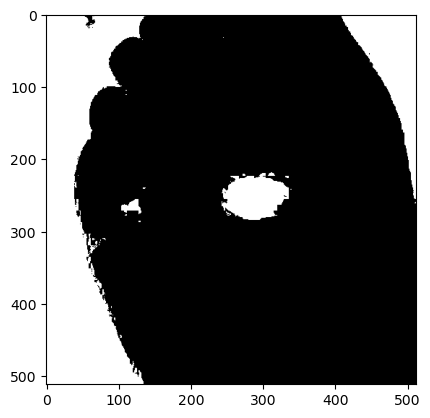

In [89]:
# Escogemos un mubral bajo de 4 invertido, ya que la lesión se encuentra en baja intensidad
_, u19_q_thr = cv2.threshold(u19_q, 2, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u19_q_thr, cmap='gray');

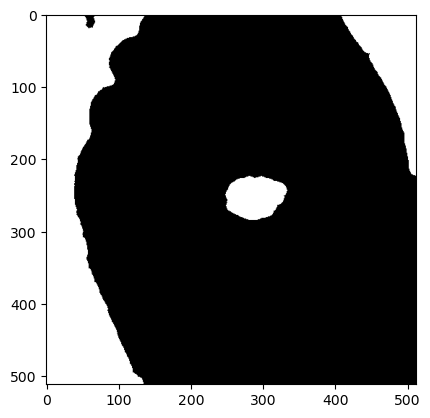

In [90]:
# Aplicamos una apertura para limpiar la imagen
se19 = morph.disk(8)
u19_q_op = cv2.morphologyEx(u19_q_thr, cv2.MORPH_OPEN, se19, iterations=1)
plt.imshow(u19_q_op, cmap='gray');

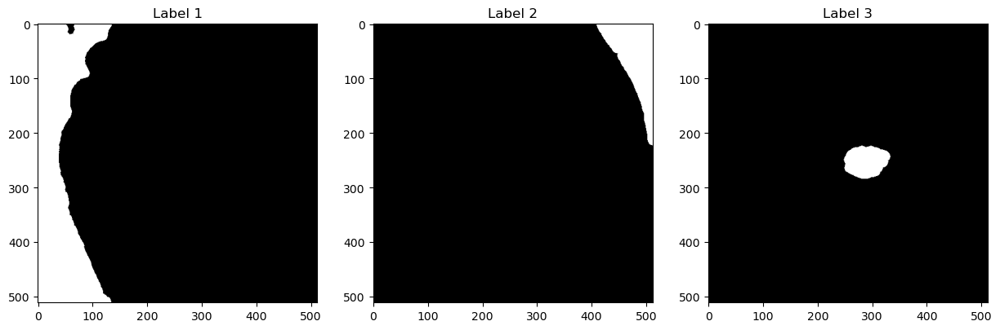

In [91]:
# Para deshacernos del fondo vamos a sacar las labels de los elementos que quedan en la imagen
u19_labels = morph.label(u19_q_op)
fig, ax = plt.subplots(1,u19_labels.max(),figsize=(15,15))
for i in range(1, u19_labels.max()+1):
    ax[i-1].imshow(u19_labels == i, cmap='gray')   
    ax[i-1].set_title(f'Label {i}');

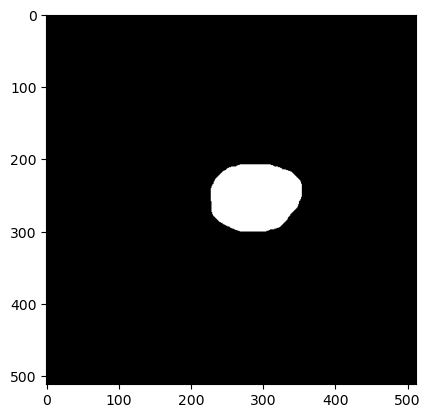

In [92]:
# Vemos que nuestra lesión es label 3, entonces la seleccionamos y hacemos unas dilataciones de elipse horizontal para mejorarla
u19_mask = u19_labels == 3
u19_mask = cv2.dilate(u19_mask.astype(np.uint8), morph.ellipse(5,4), iterations=4).astype(bool)
plt.imshow(u19_mask, cmap='gray');

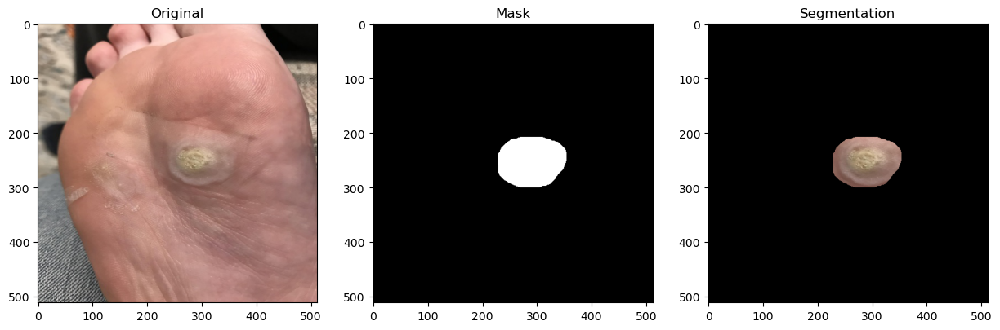

In [93]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u19_segmented = u19_rgb * u19_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u19_rgb, u19_mask, u19_segmented)

## #20. U20

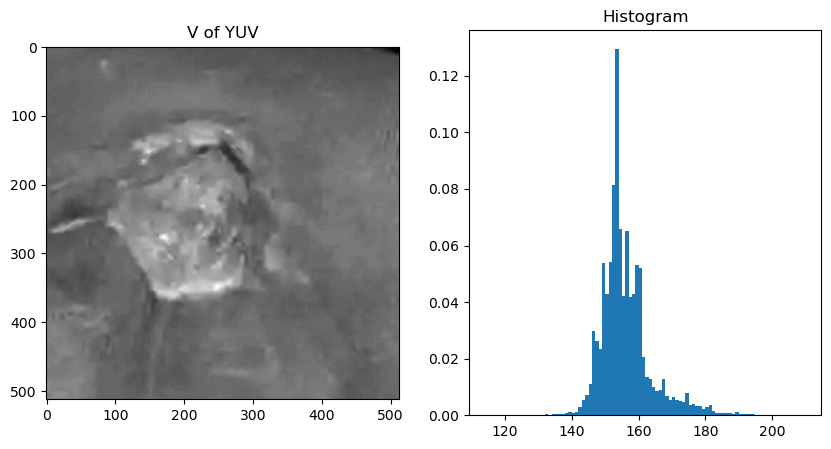

In [94]:
u20 = cv2.imread('Ulcers/U20.png')
u20_rgb = cv2.cvtColor(u20, cv2.COLOR_BGR2RGB)

# Escogemos el canal V del YUV
u20_v = cv2.cvtColor(u20, cv2.COLOR_BGR2YUV)[:,:,2]
show_img_channel_and_histogram(u20_v, 'V of YUV')

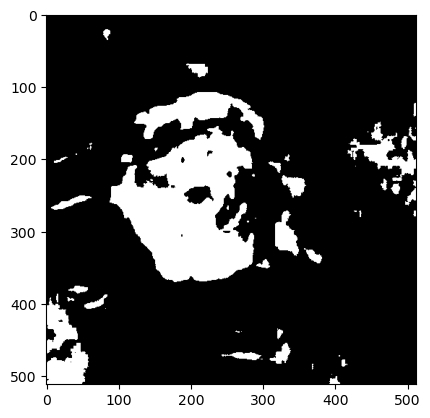

In [95]:
# La lesión está en una region de alta intensidad aplicamos un mubral de 160
_, u20_v_thr = cv2.threshold(u20_v, 160, 255, cv2.THRESH_BINARY)
plt.imshow(u20_v_thr, cmap='gray');

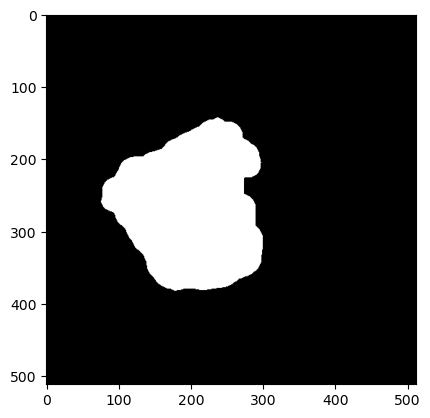

In [96]:
# Hacemos ahora un remove small objects
u20_mask = morph.remove_small_objects(u20_v_thr > 127, min_size=10000)
# Aplicamos ahora operaciones morflógicas comenzando con una de cierre para unir la lesión
se20 = morph.ellipse(5, 7)
u20_mask = cv2.morphologyEx(u20_mask.astype(np.uint8), cv2.MORPH_CLOSE, se20, iterations=3)
# Y ahora una dilatación para mejorar la máscara
u20_mask = (cv2.dilate(u20_mask, morph.disk(4), iterations=3)).astype(bool)
plt.imshow(u20_mask, cmap='gray');

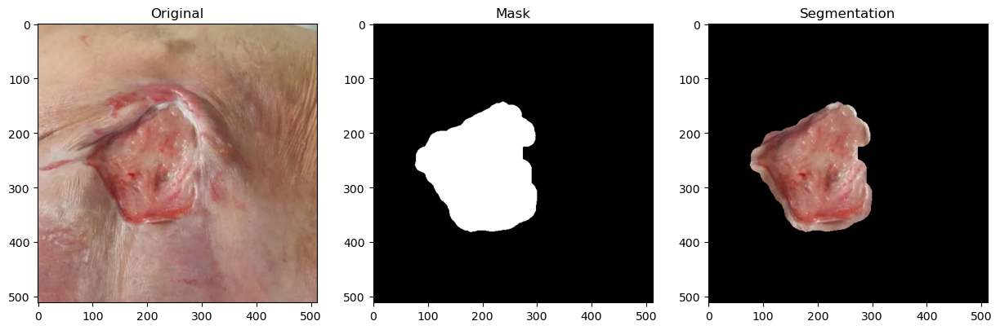

In [97]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u20_segmented = u20_rgb * u20_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u20_rgb, u20_mask, u20_segmented)

## #21. U21

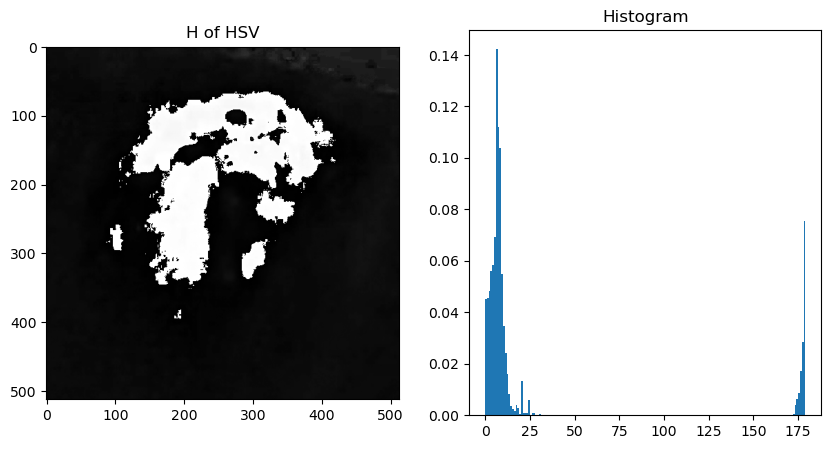

In [98]:
u21 = cv2.imread('Ulcers/U21.png')
u21_rgb = cv2.cvtColor(u21, cv2.COLOR_BGR2RGB)

# Tras analizar con el script de color channel visualizer, escogemos el canal H del HSV
u21_h = cv2.cvtColor(u21, cv2.COLOR_BGR2HSV)[:,:,0]
show_img_channel_and_histogram(u21_h, 'H of HSV')

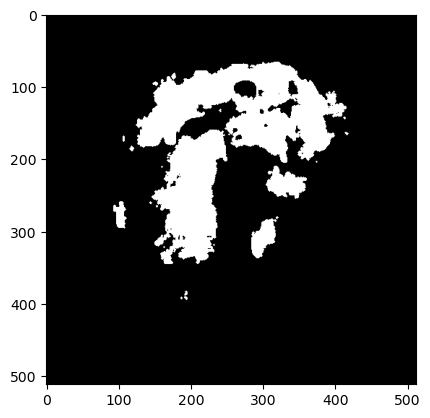

In [99]:
# Es fácilmente aplicable una umbralización de alta intensidad, según el histograma de 160 está bien
_, u21_h_thr = cv2.threshold(u21_h, 155, 255, cv2.THRESH_BINARY)
# Aplicamos una apertura ligera para limpiar un poco los alrededores no deseados
se21 = morph.disk(1)
u21_h_op = cv2.morphologyEx(u21_h_thr, cv2.MORPH_OPEN, se21, iterations=1)
plt.imshow(u21_h_op, cmap='gray');

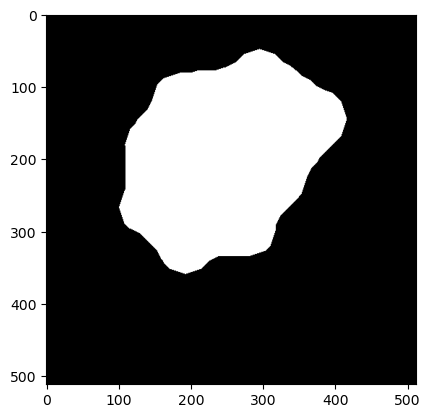

In [100]:
# Aplicamos un cierre para unir las áreas de la lesión con un elipse vertical
se21 = morph.ellipse(11, 12)
u21_h_cl = cv2.morphologyEx(u21_h_op, cv2.MORPH_CLOSE, se21, iterations=6)
# Pulimos con un pequeño disco para definir la máscara
u21_mask = cv2.morphologyEx(u21_h_cl, cv2.MORPH_OPEN, morph.disk(5), iterations=7) > 127
plt.imshow(u21_mask, cmap='gray');

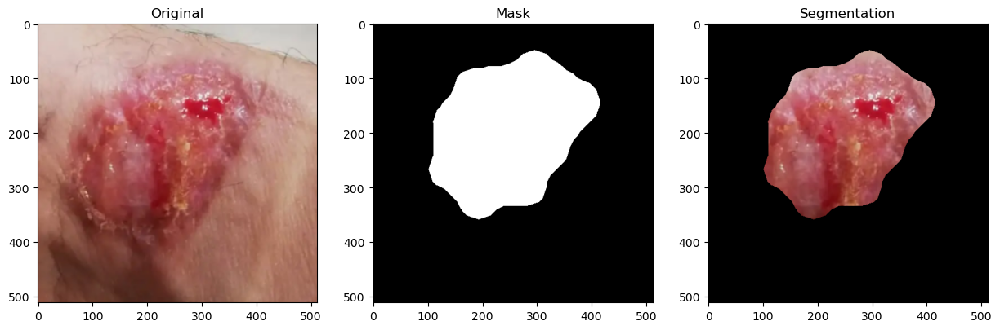

In [101]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u21_segmented = u21_rgb * u21_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u21_rgb, u21_mask, u21_segmented)

## #22. U22

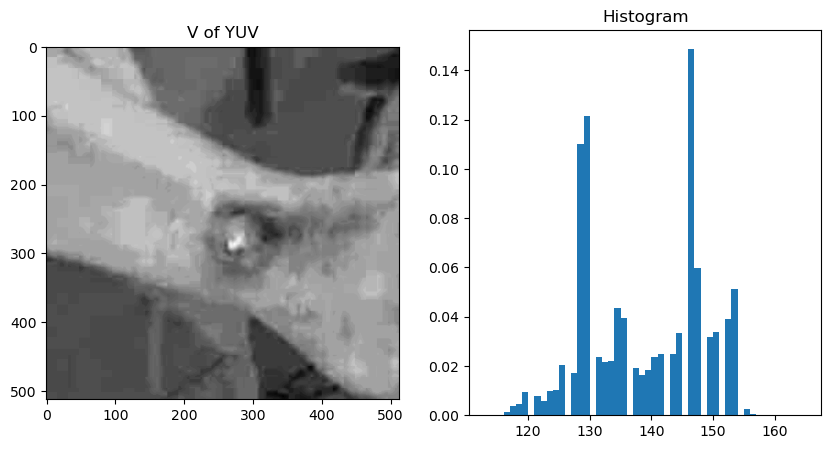

In [102]:
u22 = cv2.imread('Ulcers/U22.jpg')
u22_rgb = cv2.cvtColor(u22, cv2.COLOR_BGR2RGB)

# Escogemos el canal V del YUV según lo visto en el script
u22_v = cv2.cvtColor(u22, cv2.COLOR_BGR2YUV)[:,:,2]
show_img_channel_and_histogram(u22_v, 'V of YUV')

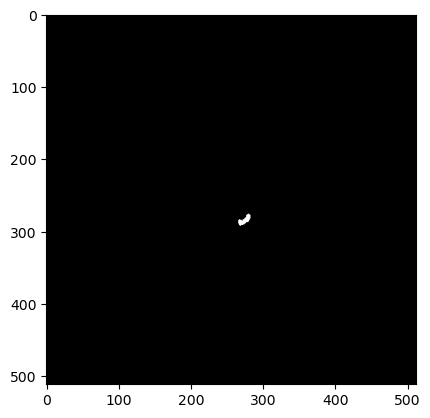

In [103]:
# Aplicamos un umbral alto de 156, ya que la lesión está en una región de alta intensidad y el histograma tiene baja acumulación ahí en adelante
_, u22_v_thr = cv2.threshold(u22_v, 156, 255, cv2.THRESH_BINARY)
plt.imshow(u22_v_thr, cmap='gray');

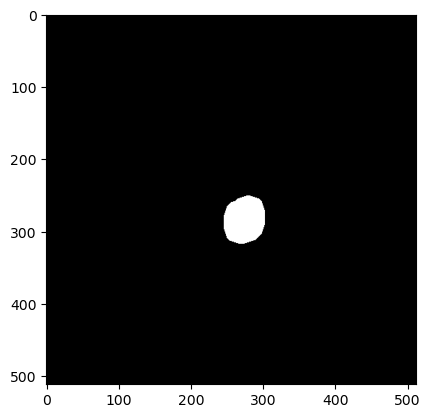

In [104]:
# Aplicamos dilataciones con una elipse
se22 = morph.ellipse(4, 5)
u22_mask = cv2.dilate(u22_v_thr, se22, iterations=5)
# Pulimos la máscara con un disco
u22_mask = cv2.morphologyEx(u22_mask, cv2.MORPH_OPEN, morph.disk(5), iterations=4) > 127
plt.imshow(u22_mask, cmap='gray');

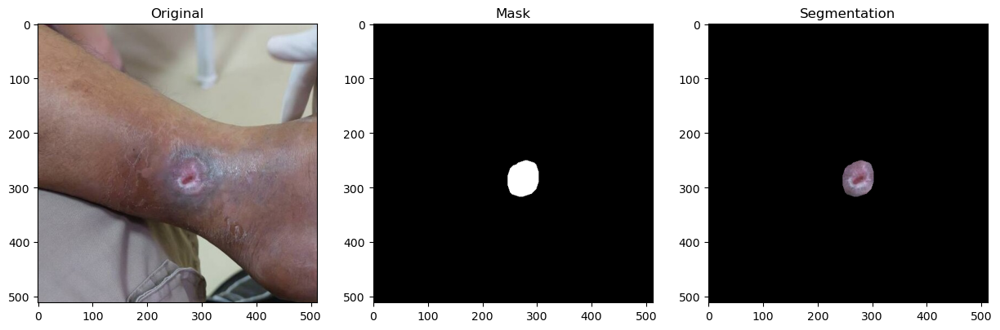

In [105]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u22_segmented = u22_rgb * u22_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u22_rgb, u22_mask, u22_segmented)

## #22. U22

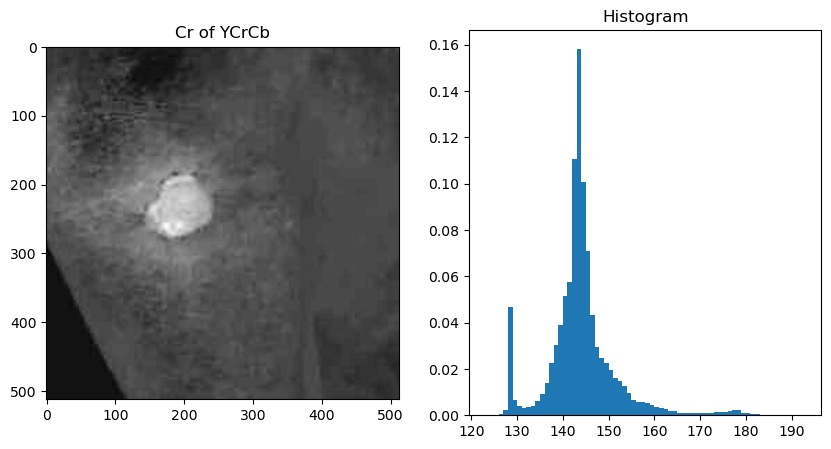

In [106]:
u23 = cv2.imread('Ulcers/U23.jpg')
u23_rgb = cv2.cvtColor(u23, cv2.COLOR_BGR2RGB)

# Tras analizar con el script, se escoge el Cr del YCrCb
u23_cr = cv2.cvtColor(u23, cv2.COLOR_BGR2YCrCb)[:,:,1]
show_img_channel_and_histogram(u23_cr, 'Cr of YCrCb')

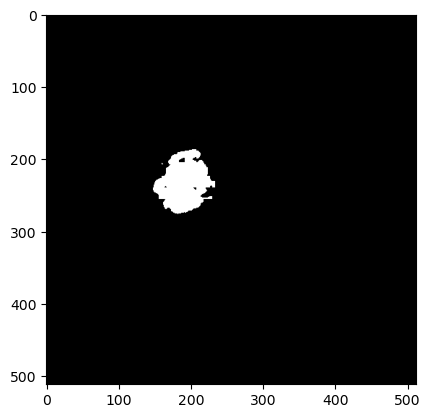

In [107]:
# Según el hisograma vemos que hay una aucmulación leve de pixeles luego de 170, los cuáles son de la lesión en alta intensidad (blanca)
_, u23_cr_thr = cv2.threshold(u23_cr, 170, 255, cv2.THRESH_BINARY)
plt.imshow(u23_cr_thr, cmap='gray');

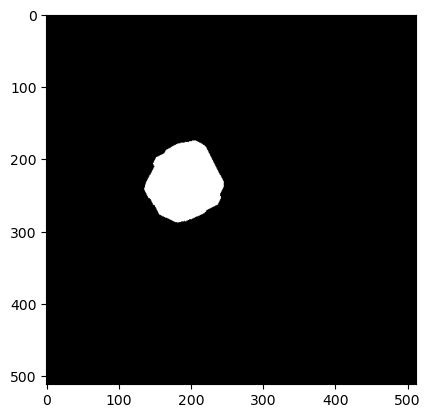

In [108]:
# Aplicamos cierre para dejarla bien definida
se23 = morph.disk(3)
u23_cr_cl = cv2.morphologyEx(u23_cr_thr, cv2.MORPH_CLOSE, se23, iterations=9)
# Y ahora pulimos con un disco de 4 dilatando
u23_mask = cv2.morphologyEx(u23_cr_cl, cv2.MORPH_DILATE, morph.disk(3), iterations=4) > 127
plt.imshow(u23_mask, cmap='gray');

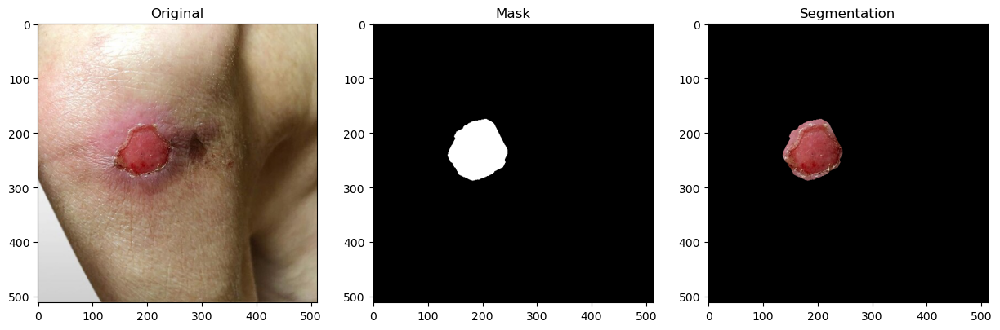

In [109]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u23_segmented = u23_rgb * u23_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u23_rgb, u23_mask, u23_segmented)

## #24. U24

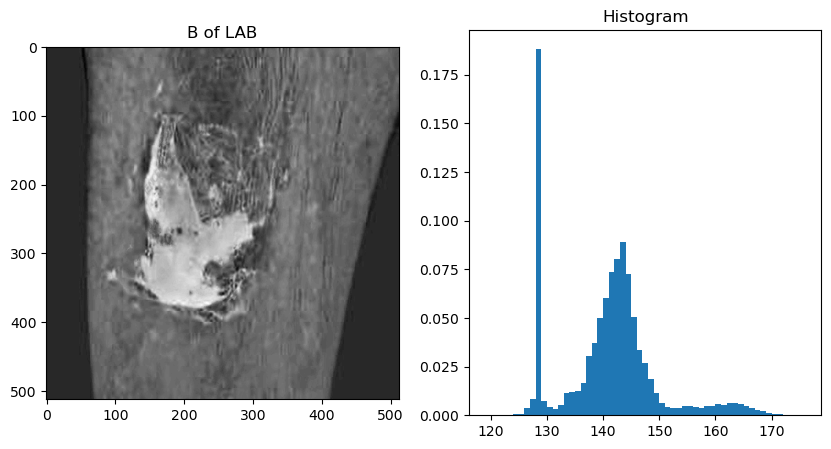

In [110]:
u24 = cv2.imread('Ulcers/U24.jpg')
u24_rgb = cv2.cvtColor(u24, cv2.COLOR_BGR2RGB)

# Escogemos el canal B del LAB, ya que en los gráficos generados por el script si visualiza muy bien la lesión
u24_b = cv2.cvtColor(u24, cv2.COLOR_BGR2LAB)[:,:,2]
show_img_channel_and_histogram(u24_b, 'B of LAB')

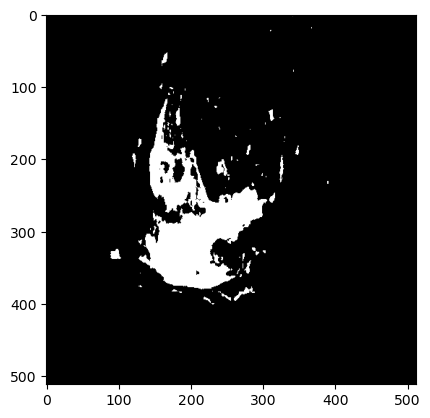

In [111]:
"""Aplicamos un umbral de 153, ya que según el histograma luego de ese valor viene otra acumulación de pixeles
que probablemente corresponden a los de alta intensidad de la lesión a segmentar"""
_, u24_b_thr = cv2.threshold(u24_b, 153, 255, cv2.THRESH_BINARY)
plt.imshow(u24_b_thr, cmap='gray');

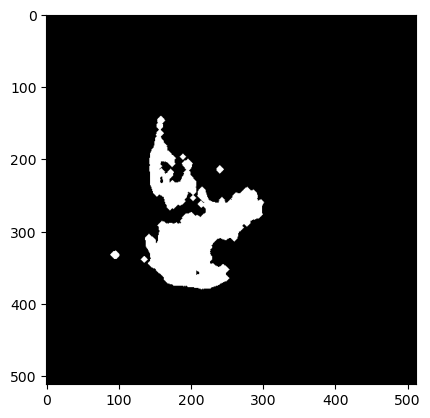

In [112]:
# Hacemos una apertura ligera con disco de 1
u24_b_op = cv2.morphologyEx(u24_b_thr, cv2.MORPH_OPEN, morph.disk(2), iterations=2)
plt.imshow(u24_b_op, cmap='gray');

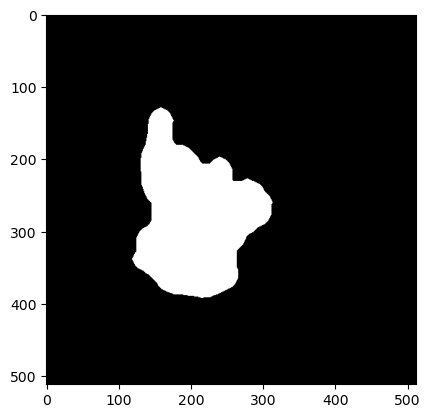

In [113]:
# Aplicamos ahora un cierre con elipse vertical para unir las estructuras
se24 = morph.ellipse(6, 8)
u24_b_cl = cv2.morphologyEx(u24_b_op, cv2.MORPH_CLOSE, se24, iterations=3)
# Aplicamos un remove small objects para limpiar la imagen
u24_mask = morph.remove_small_objects(u24_b_cl > 127, min_size=500)
# Finalmente aplicamos unas dilataciones para mejorar la máscara
u24_mask = (cv2.dilate(u24_mask.astype(np.uint8), morph.disk(3), iterations=4)).astype(bool)
plt.imshow(u24_mask, cmap='gray');

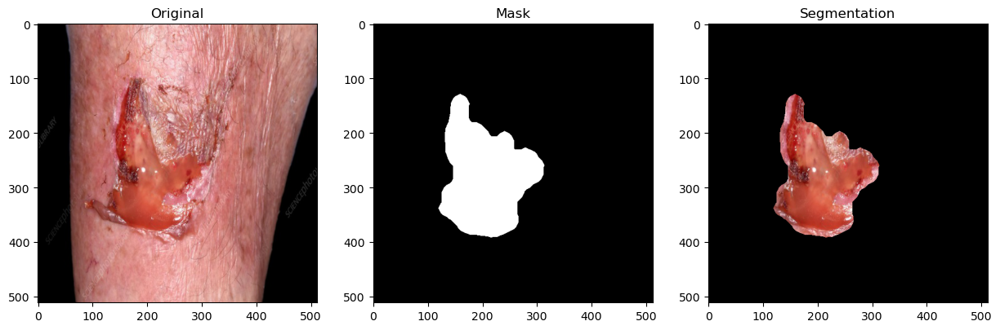

In [114]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u24_segmented = u24_rgb * u24_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u24_rgb, u24_mask, u24_segmented)

## #25. U25

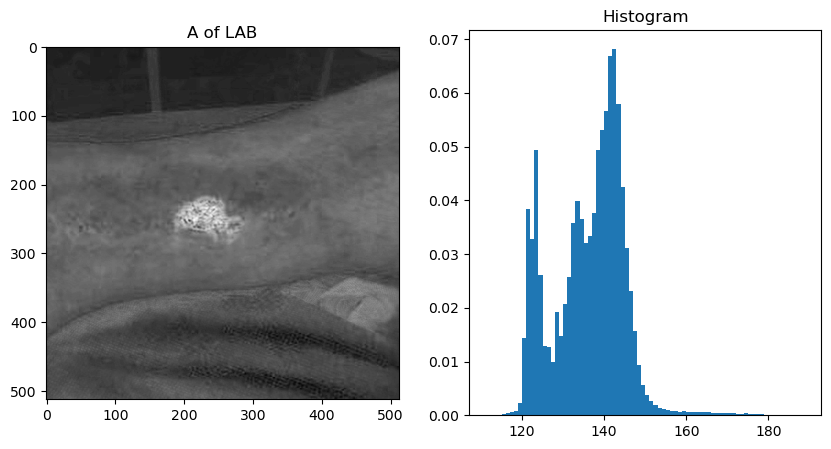

In [115]:
u25 = cv2.imread('Ulcers/U25.jpeg')
u25_rgb = cv2.cvtColor(u25, cv2.COLOR_BGR2RGB)

# Tras analizar con el script, se escoge el A del LAB
u25_a = cv2.cvtColor(u25, cv2.COLOR_BGR2LAB)[:,:,1]
show_img_channel_and_histogram(u25_a, 'A of LAB')

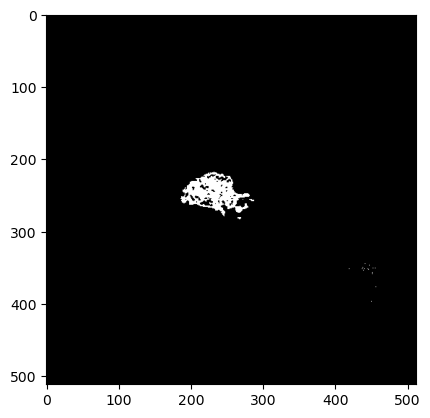

In [116]:
# Le lesión sale con píxeles de alta intensidad, apliquemos un umbral como de 157
_, u25_a_thr = cv2.threshold(u25_a, 157, 255, cv2.THRESH_BINARY)
plt.imshow(u25_a_thr, cmap='gray');

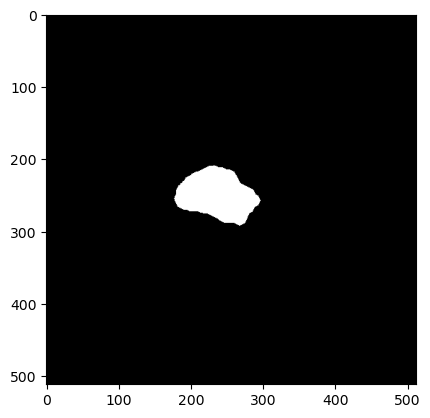

In [117]:
# Aplicamos un cierre con elipse horizontal para unir la lesión
se25 = morph.ellipse(10, 6)
u25_a_cl = cv2.morphologyEx(u25_a_thr, cv2.MORPH_CLOSE, se25, iterations=5)
# Aplicamos un remove small objects para limpiar la imagen
u25_mask = morph.remove_small_objects(u25_a_cl > 127, min_size=500)
# Y ahora una dilatación para mejorar la máscara
u25_mask = (cv2.dilate(u25_mask.astype(np.uint8), morph.disk(3), iterations=3)).astype(bool)
plt.imshow(u25_mask, cmap='gray');

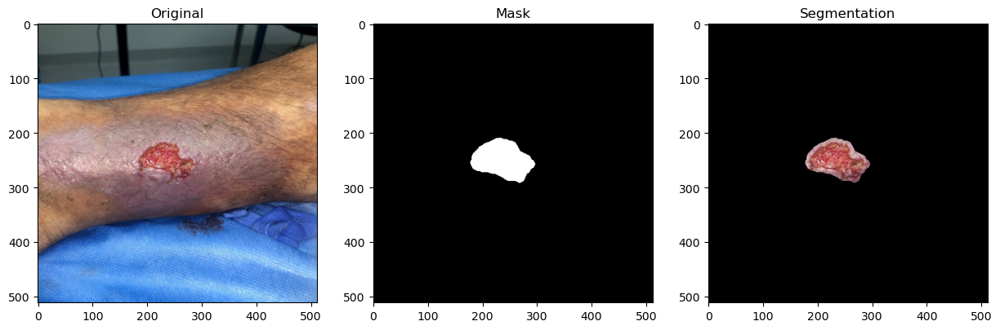

In [118]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u25_segmented = u25_rgb * u25_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u25_rgb, u25_mask, u25_segmented)

## #26. U26

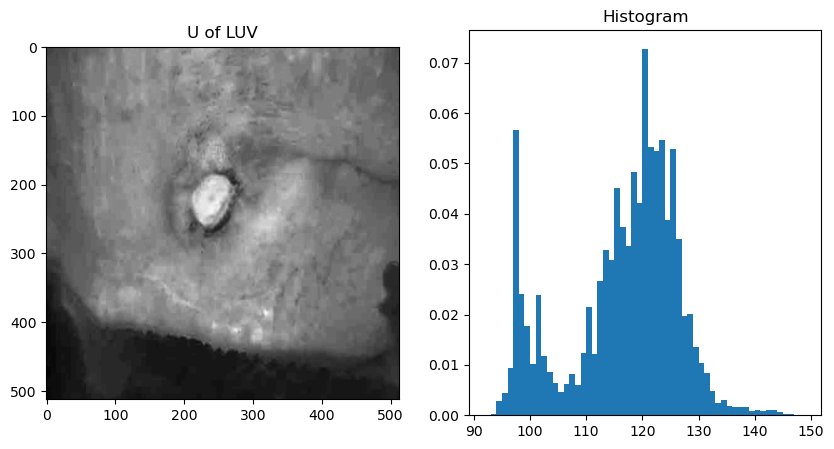

In [119]:
u26 = cv2.imread('Ulcers/U26.png')
u26_rgb = cv2.cvtColor(u26, cv2.COLOR_BGR2RGB)

# Analizando los canales de color con el script, se escoge el canal U del LUV
u26_u = cv2.cvtColor(u26, cv2.COLOR_BGR2LUV)[:,:,1]
show_img_channel_and_histogram(u26_u, 'U of LUV')

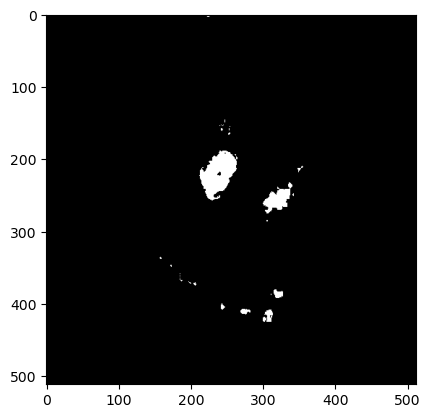

In [120]:
# Le lesión tiene píxeles de alta intensidad, entonces vamos a aplicar uno de 134
_, u26_u_thr = cv2.threshold(u26_u, 134, 255, cv2.THRESH_BINARY)
plt.imshow(u26_u_thr, cmap='gray');

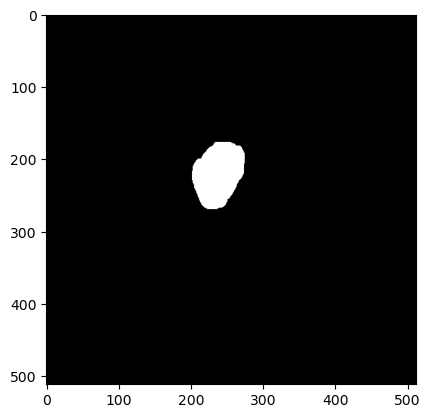

In [121]:
# Aplicamos un cierre pequeño
se26 = morph.disk(3)
u26_u_cl = cv2.morphologyEx(u26_u_thr, cv2.MORPH_CLOSE, se26, iterations=2)
# Aplicamos un remove small objects para limpiar la imagen
u26_mask = morph.remove_small_objects(u26_u_cl > 127, min_size=1000)
# Y ahora unas dilataciones con elipse vertical para pulir la máscara
for i in range(2):
    u26_mask = morph.binary_dilation(u26_mask, morph.ellipse(5, 6))
plt.imshow(u26_mask, cmap='gray');

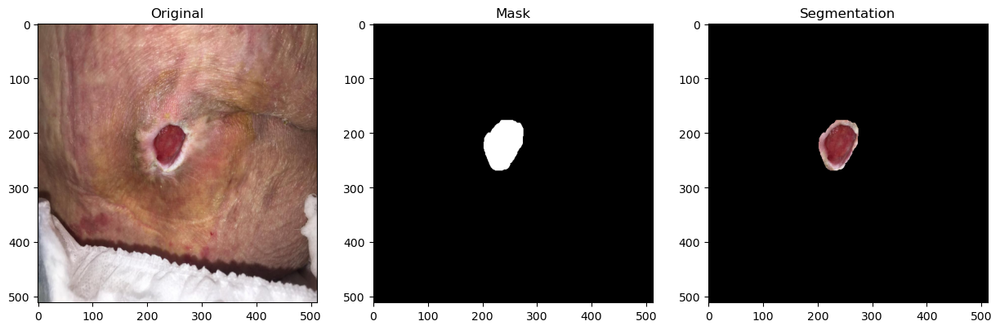

In [122]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u26_segmented = u26_rgb * u26_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u26_rgb, u26_mask, u26_segmented)

## #27. U27

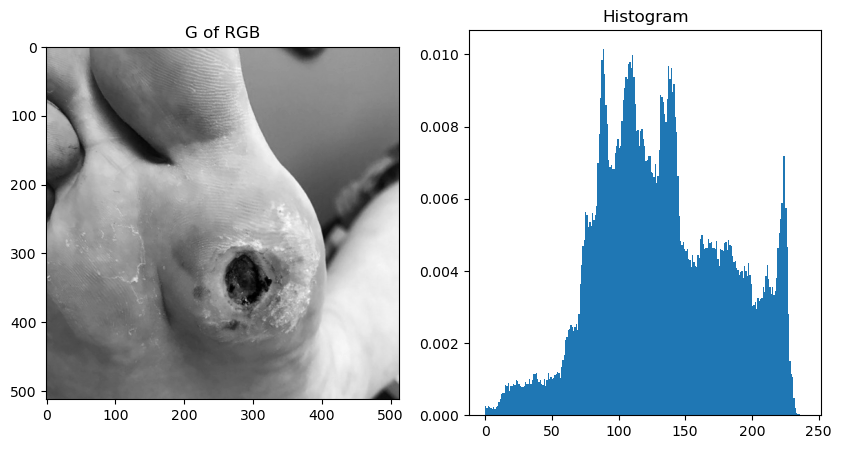

In [123]:
u27 = cv2.imread('Ulcers/U27.jpg')
u27_rgb = cv2.cvtColor(u27, cv2.COLOR_BGR2RGB)

# Escogemos el canal G del RGB, ya que en el script se ve que la lesión se ve muy bien en este canal
u27_g = u27_rgb[:,:,1].copy()
show_img_channel_and_histogram(u27_g, 'G of RGB')

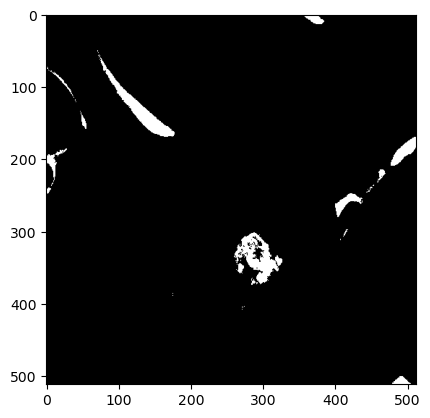

In [124]:
# La lesión tiene píxeles de baja intensidad, aplicamos un umbra bajo invertido
_, u27_g_thr = cv2.threshold(u27_g, 35, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u27_g_thr, cmap='gray');

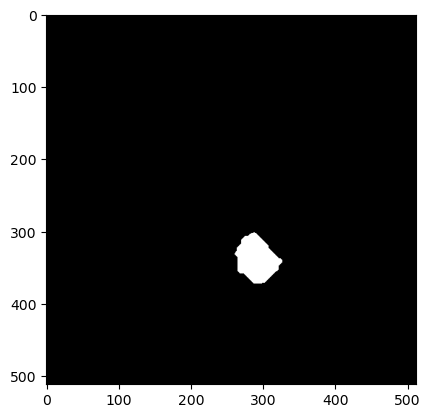

In [125]:
# Aplicamos una apertura ligera para limpiar un poco
se27 = morph.disk(1)
u27_g_op = cv2.morphologyEx(u27_g_thr, cv2.MORPH_OPEN, se27, iterations=2)
# Aplicamos ahora un cierre con estructura de elipse para unir la lesión
se27 = morph.ellipse(5, 7)
u27_g_cl = cv2.morphologyEx(u27_g_op, cv2.MORPH_CLOSE, se27, iterations=4)
# Aplicamos ahora un remove small objects para limpiar la imagen
u27_mask = morph.remove_small_objects(u27_g_cl > 127, min_size=2000)
plt.imshow(u27_mask, cmap='gray');

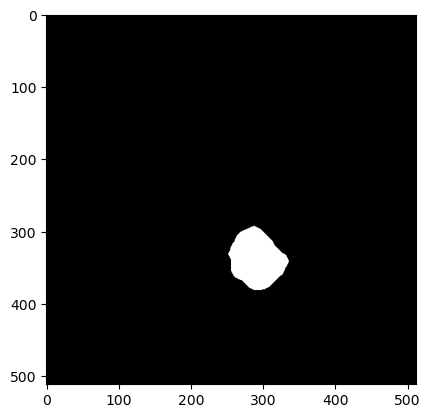

In [126]:
# Terminamos de pulir con unas dilataciones de disco
for i in range (3):
    u27_mask = morph.binary_dilation(u27_mask, morph.disk(3))
plt.imshow(u27_mask, cmap='gray');

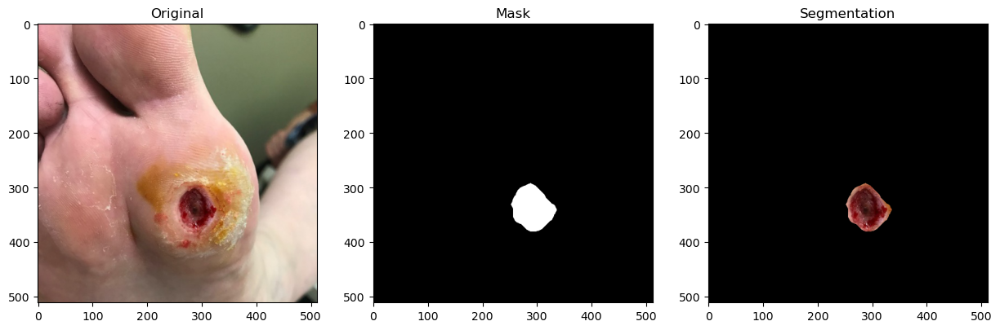

In [127]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u27_segmented = u27_rgb * u27_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u27_rgb, u27_mask, u27_segmented)

## #28. U28

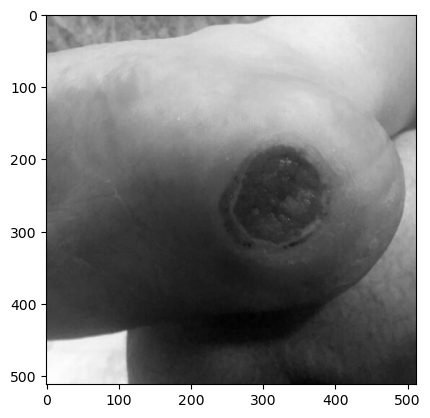

In [128]:
u28 = cv2.imread('Ulcers/U28.jpg')
u28_rgb = cv2.cvtColor(u28, cv2.COLOR_BGR2RGB)
u28_gray = cv2.cvtColor(u28, cv2.COLOR_BGR2GRAY)

# Tras analizar los canales de color con el script, se ve complicado con todos, por lo cual una con píxel semilla y morfología es más factible
plt.imshow(u28_gray, cmap='gray');

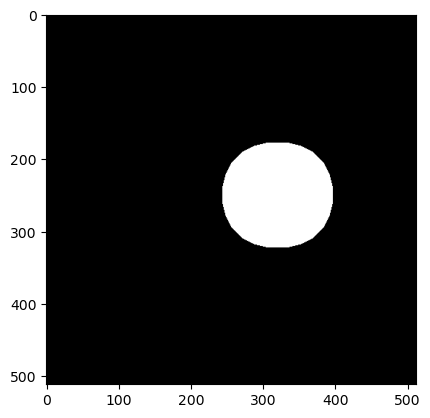

In [129]:
# Al analizar la lesión, es de forma circular, por lo que tomamos un base de ceros, y ponemos píxel semilla en (250,320)
u28_base = np.zeros_like(u28_gray)
u28_base[250,320] = 255
# Aplicamos una dilatación con disco para mejorar la máscara
u28_mask = cv2.dilate(u28_base, morph.disk(10), iterations=4) > 127
# Refinamos con una elipse
for i in range(4):
    u28_mask = morph.binary_dilation(u28_mask, morph.ellipse(9, 8))
plt.imshow(u28_mask, cmap='gray');

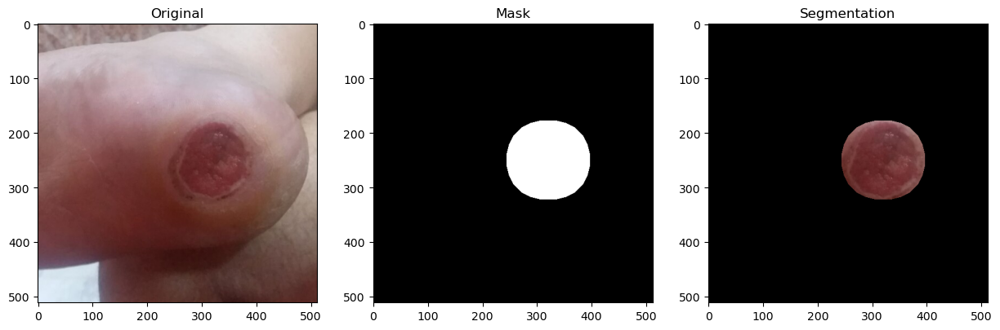

In [130]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u28_segmented = u28_rgb * u28_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u28_rgb, u28_mask, u28_segmented)

## #29. U29

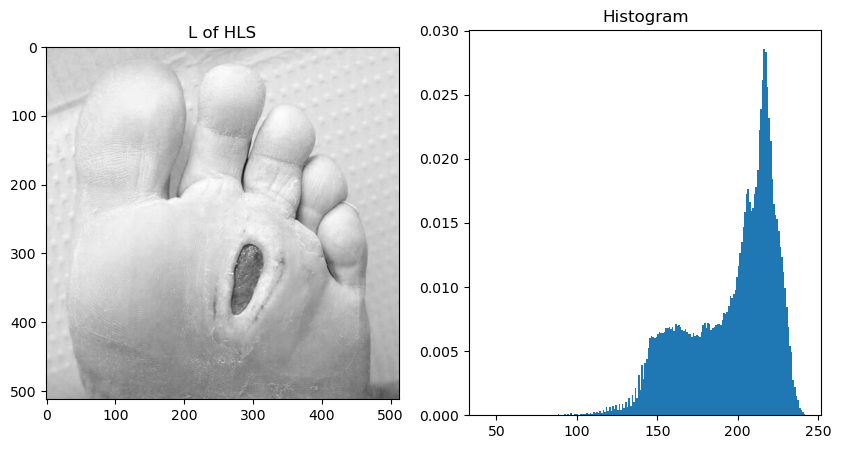

In [134]:
u29 = cv2.imread('Ulcers/U29.jpg')
u29_rgb = cv2.cvtColor(u29, cv2.COLOR_BGR2RGB)

# Tras analizar con el script, se escoge el canal L del HLS
u29_l = cv2.cvtColor(u29, cv2.COLOR_BGR2HLS)[:,:,1]
show_img_channel_and_histogram(u29_l, 'L of HLS')

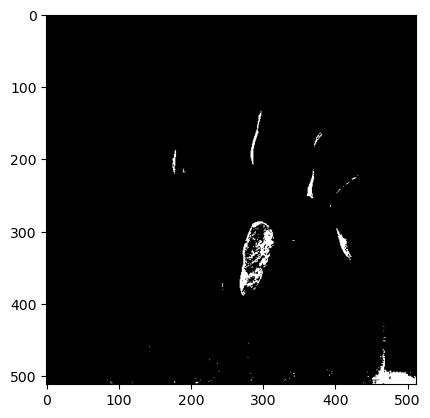

In [203]:
# La lesión está en región de baja intensidad, aplicamos un umbral de 134 invertido
_, u29_l_thr = cv2.threshold(u29_l, 131, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u29_l_thr, cmap='gray');

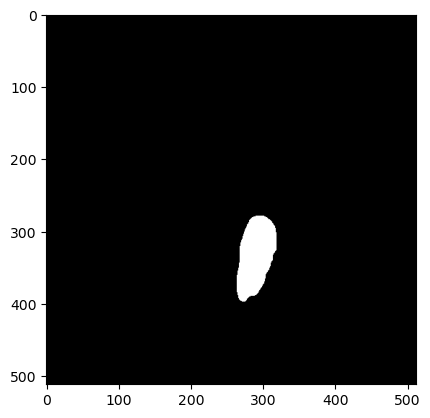

In [208]:
# Antes de todo hacemos un cierre con elipse vertical para unir la lesión
se29 = morph.ellipse(5, 7)
u29_l_cl = cv2.morphologyEx(u29_l_thr, cv2.MORPH_CLOSE, se29, iterations=2)
# Aplicamos un remove small objects para limpiar la imagen
u29_mask = morph.remove_small_objects(u29_l_cl > 127, min_size=150)
# Ahora operaciones de cierre con elipse vertical para unir la lesión
se29 = morph.ellipse(9, 13)
for i in range(5):
    u29_mask = morph.binary_closing(u29_mask, se29)
# Un ultimo remove small objects para lo que no es de la lesión
u29_mask = morph.remove_small_objects(u29_mask, min_size=2000)
# Pulimos con una dilatación de elipse
for i in range(2):
    u29_mask = morph.binary_dilation(u29_mask, morph.ellipse(2, 4))
plt.imshow(u29_mask, cmap='gray');

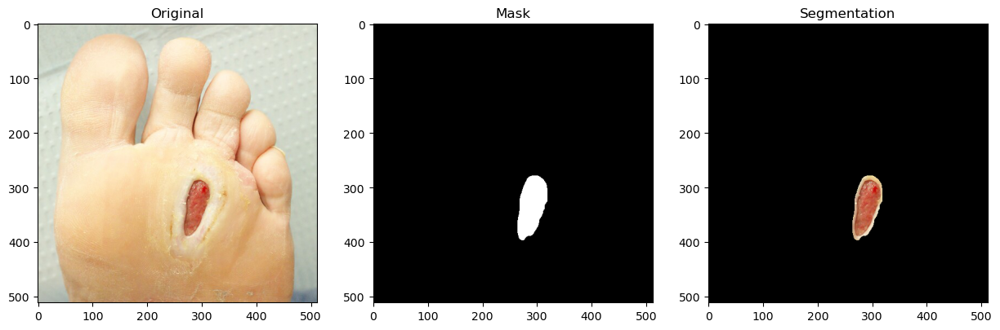

In [209]:
# Aplicamos la máscara y segmentamos
u29_segmented = u29_rgb * u29_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u29_rgb, u29_mask, u29_segmented)

## #30. U30

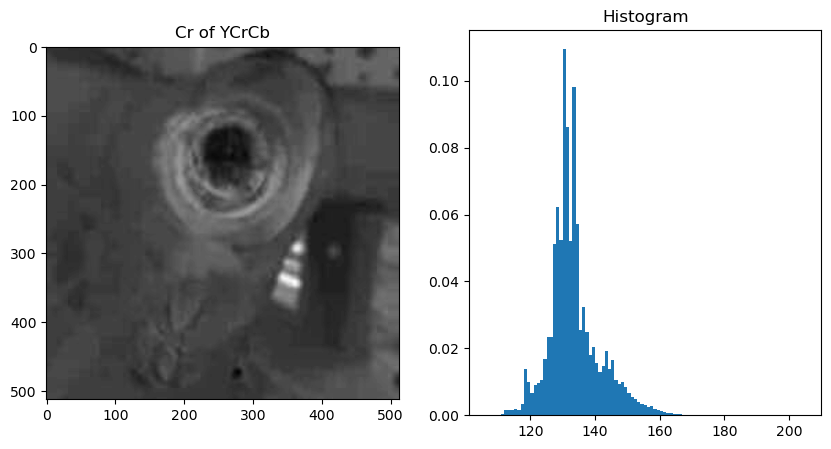

In [210]:
u30 = cv2.imread('Ulcers/U30.jpg')
u30_rgb = cv2.cvtColor(u30, cv2.COLOR_BGR2RGB)

# Tras analizar con el script, se escoge el canal Cr del YCrCb
u30_cr = cv2.cvtColor(u30, cv2.COLOR_BGR2YCrCb)[:,:,1]
show_img_channel_and_histogram(u30_cr, 'Cr of YCrCb')

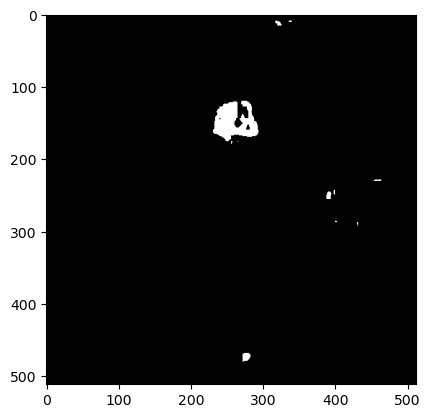

In [240]:
# La lesión en este espacio de color se define por píxeles de baja intensidad, aplicamos un umbral de 110 invertido
_, u30_cr_thr = cv2.threshold(u30_cr, 116, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u30_cr_thr, cmap='gray');

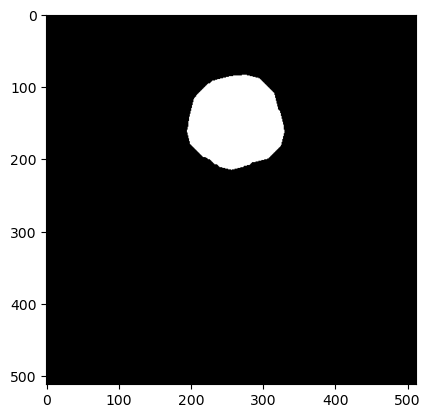

In [249]:
# Aplicamos ahora un cierre para unir el área de la lesión
se30 = morph.ellipse(4,6)
u30_cr_cl = cv2.morphologyEx(u30_cr_thr, cv2.MORPH_CLOSE, se30, iterations=2)
# Aplicamos ahora un remove small objects para limpiar la imagen
u30_mask = morph.remove_small_objects(u30_cr_cl > 127, min_size=800)
# Dilatamos con una elipse ligeramente vertical para mejorar la máscara
for i in range(4):
    u30_mask = morph.binary_dilation(u30_mask, morph.disk(9))
plt.imshow(u30_mask, cmap='gray');

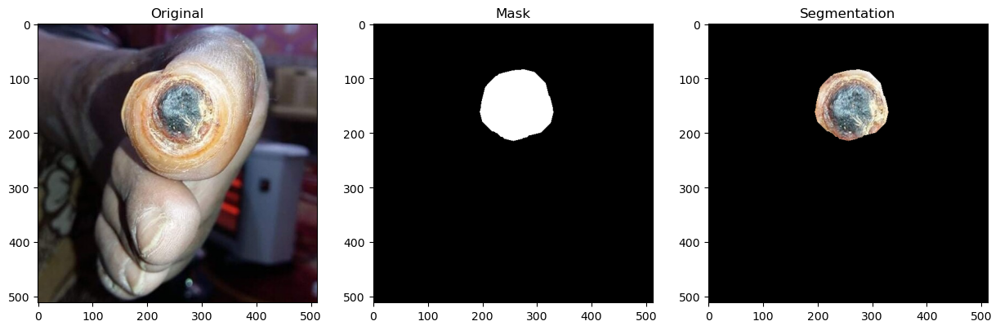

In [250]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u30_segmented = u30_rgb * u30_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u30_rgb, u30_mask, u30_segmented)

## #31. U31

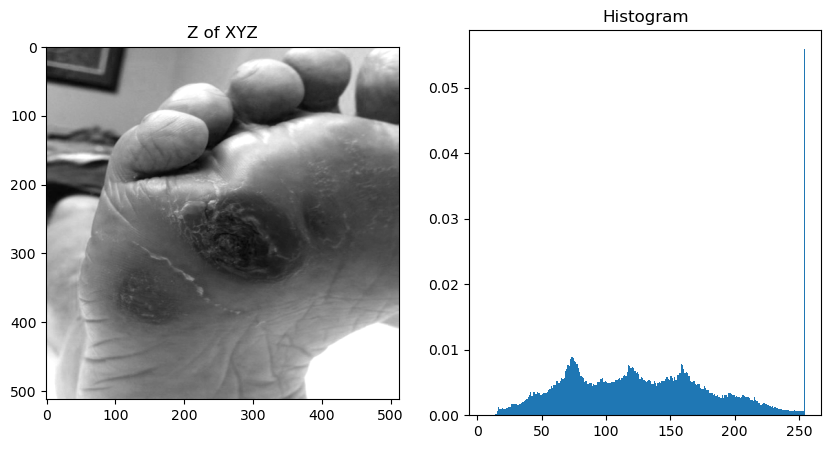

In [255]:
u31 = cv2.imread('Ulcers/U31.jpg')
u31_rgb = cv2.cvtColor(u31, cv2.COLOR_BGR2RGB)

# Tras analizar con el script, se escoge el canal Z del XYZ
u31_z = cv2.cvtColor(u31, cv2.COLOR_BGR2XYZ)[:,:,2]
show_img_channel_and_histogram(u31_z, 'Z of XYZ')

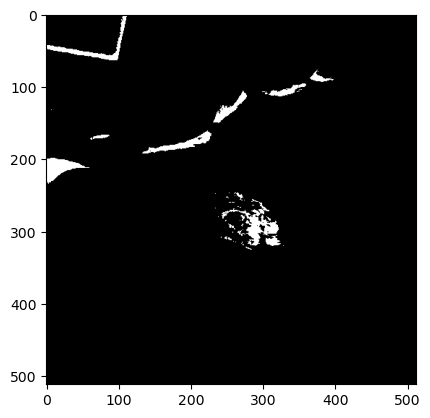

In [443]:
# La lesión está en una región de baja intensidad, aplicamos un umbral de 90 invertido
_, u31_z_thr = cv2.threshold(u31_z, 30, 255, cv2.THRESH_BINARY_INV)
plt.imshow(u31_z_thr, cmap='gray');

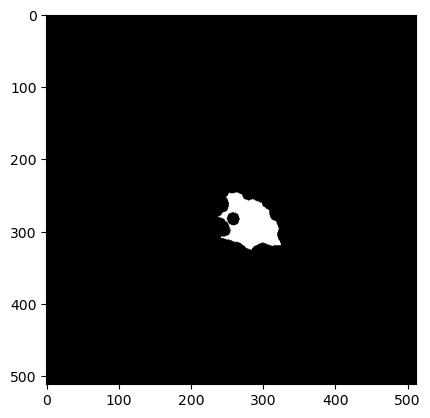

In [447]:
# Aplicamos ahoraun cierre con disco para unir la lesión, con una elipse ligeramente vertical
se31 = morph.ellipse(1,2)
u31_z_cl = cv2.morphologyEx(u31_z_thr, cv2.MORPH_CLOSE, se31, iterations=3)
# Aplicamos ahora un remove small objects para limpiar la imagen
u31_mask = morph.remove_small_objects(u31_z_cl > 127, min_size=1000)
# Hacemos unos cierre con disco paratener una mejor definición de la lesión
for i in range(10):
    u31_mask = morph.binary_closing(u31_mask, morph.disk(8))
plt.imshow(u31_mask, cmap='gray');

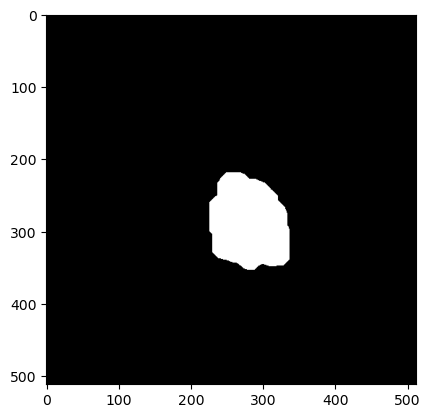

In [448]:
# Terminamos de pulir con unas dilataciones de disco
for i in range (4):
    u31_mask = morph.binary_dilation(u31_mask, morph.ellipse(3, 7))
plt.imshow(u31_mask, cmap='gray');

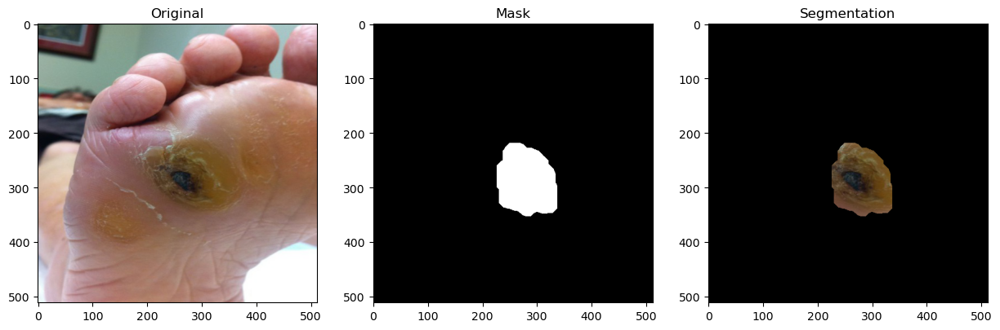

In [449]:
""" RESULTADO FINAL """
# Aplicamos la máscara y segmentamos
u31_segmented = u31_rgb * u31_mask[:,:,np.newaxis]
show_img_mask_and_segmentation(u31_rgb, u31_mask, u31_segmented)

## #32. U32

In [ ]:
u32 = cv2.imread('Ulcers/U32.jpg')
u32_rgb = cv2.cvtColor(u32, cv2.COLOR_BGR2RGB)

